In [1]:
# Import Python libaries
from sklearn.inspection import PartialDependenceDisplay
from gp import Matern
from scipy import stats
from autooed.utils.plot import plot_performance_space, plot_performance_metric, plot_performance_space_diffcolor
from scipy.interpolate import BSpline, make_interp_spline
from autooed.utils.pareto import find_pareto_front
from pymoo.performance_indicator.hv import Hypervolume
from autooed.utils.pareto import convert_minimization
import math
import io
import itertools
import os
from scipy.optimize import minimize
from scipy import ndimage, misc
from scipy.stats import pearsonr
from numpy import cov
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.utils.optimize import _check_optimize_result
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.gaussian_process.kernels import Matern as MaternKernel, _check_length_scale
from sklearn.gaussian_process.kernels import RBF, ConstantKernel
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.datasets import make_friedman2
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn import svm
from sklearn.tree import export_graphviz
from sklearn.metrics import r2_score, mean_squared_error, mean_gamma_deviance, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV, LeaveOneOut
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import partial_dependence
from sklearn import preprocessing
from random import randint
from random import seed
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn import ensemble
from sklearn import linear_model
import seaborn as sns
from matplotlib import rc, rcParams
import matplotlib as mpl
import matplotlib.pyplot as plt
import random
import pandas as pd
import numpy as np
import time as time
from scipy.optimize import curve_fit
from scipy.stats import beta
%matplotlib inline


/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Text(0.5, 0, '!!!Ariaaaal')

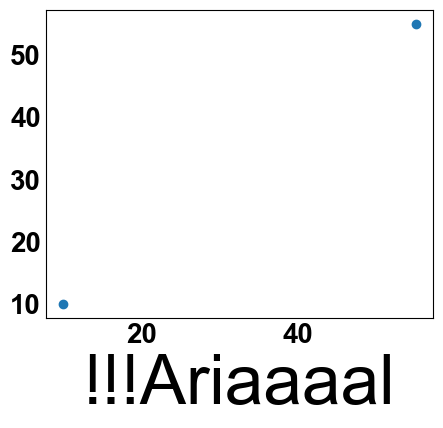

In [2]:
# check the font !!!!!!!!!!!!!!!!!!!!!
# switch to Arial
# if not working: delet ~/.catch/matplotlib
plt.rcParams["font.family"] = "Arial"
plt.rcParams['ps.useafm'] = True
plt.rcParams['pdf.fonttype'] = 42
mpl.font_manager.FontManager()
rc('font', weight='bold')
fig, ax = plt.subplots(figsize=(5, 4))
plt.scatter([10, 55], [10, 55])
ax.tick_params(axis='both', length=0, width=1.5,
               colors='black', grid_alpha=0, labelsize=20)
plt.xlabel('!!!Ariaaaal', fontname='Arial', fontsize=50)


# Fix the samples that rounding resulted in negative values for the last one.
 #97:  [ 0.31	0.09	0.20	0.40	0.01	-1.000000e-02 generated one]
 real one: [0.30701378 0.08708877 0.19961717 0.39865702 0.00716017]
 evaluated one:  [0.31 0.09 0.2 0.4 0.0 0.0]

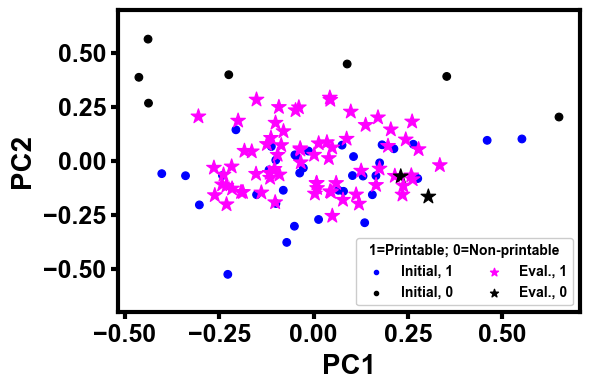

In [3]:
# Fix the samples that rounding resulted in
df_eval = pd.read_csv('new_evaluated_keep.csv',)
df_eval['Toughness(MJ/m3)'] = -df_eval['Toughness(MJ/m3)']
df_eval['Tensile_Strength(MPa)'] = -df_eval['Tensile_Strength(MPa)']
#df_eval_nozero = pd.read_csv('new_evaluated_nonzero_keep.csv',)
df_init = pd.read_csv('./Yuchao_20220816_keep.csv',)
df_init['Printability'] = df_init['Printability'].map(dict(Y=1, N=0))
x_eval = df_eval.iloc[:, 1:6]
x_init = df_init.iloc[:, 1:6]
# PCA Dimension Reduction
pca = PCA(n_components=2)
x_eval_pca = pca.fit_transform(x_eval)
x_init_pca = pca.fit_transform(x_init)

df_eval['pca1'] = x_eval_pca[:, 0]
df_eval['pca2'] = x_eval_pca[:, 1]

df_init['pca1'] = x_init_pca[:, 0]
df_init['pca2'] = x_init_pca[:, 1]

df_eval['initial'] = 'Eval.'
df_init['initial'] = 'Initial'
df = pd.concat([df_init, df_eval], axis=0)

# do not delet the non-printable cases.
fig, ax = plt.subplots(figsize=(6, 4))
hue = df['initial'].astype(str) + ', ' + df['Printability'].astype(str)
label = ['Init., Printable', 'Init., Non-printable',
         'Eval., Printable', 'Eval., Non-printable']
sns.scatterplot(data=df, x='pca1', y='pca2',
                markers=['.', '.', '*', '*'], edgecolor=None,
                palette=['blue', 'black', 'magenta', 'black'], hue=hue, style=hue,
                alpha=1, s=120,)  # label='Evaluated')
plt.ylim(-0.7, 0.7)


plt.legend(ncol=2, title='1=Printable; 0=Non-printable', framealpha=1)

ax.set_xlabel('PC1', fontsize='20', fontname='Arial',
              fontweight='bold', labelpad=5)
ax.set_ylabel('PC2', fontsize='20', fontname='Arial',
              fontweight='bold', labelpad=5)

ax.tick_params(direction='out', length=5, width=3, colors='black',
               grid_alpha=1, labelsize='18')

[i.set_linewidth(3) for i in ax.spines.values()]

plt.tight_layout()
#plt.title ('per {}, rand {}'.format(per, rand))
#plt.ylim(-25, 45)
plt.savefig('pca_printable_non.jpeg', dpi=500)


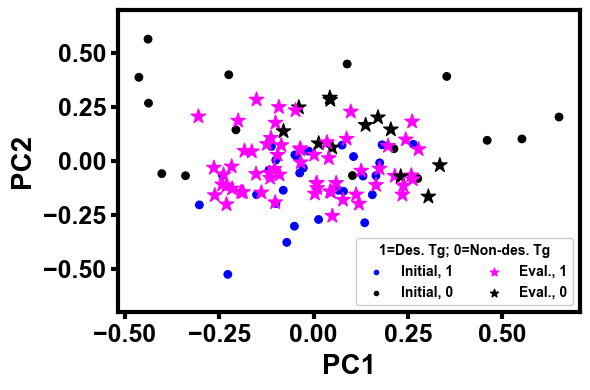

In [4]:
# Fix the samples that rounding resulted in
df_eval = pd.read_csv('new_evaluated_keep.csv',)
df_eval['Toughness(MJ/m3)'] = -df_eval['Toughness(MJ/m3)']
df_eval['Tensile_Strength(MPa)'] = -df_eval['Tensile_Strength(MPa)']
#df_eval_nozero = pd.read_csv('new_evaluated_nonzero_keep.csv',)
df_init = pd.read_csv('./Yuchao_20220816_keep.csv',)
df_init['Printability'] = df_init['Tg'].map(dict(Y=1, N=0))
x_eval = df_eval.iloc[:, 1:6]
x_init = df_init.iloc[:, 1:6]
# PCA Dimension Reduction
pca = PCA(n_components=2)
x_eval_pca = pca.fit_transform(x_eval)
x_init_pca = pca.fit_transform(x_init)

df_eval['pca1'] = x_eval_pca[:, 0]
df_eval['pca2'] = x_eval_pca[:, 1]

df_init['pca1'] = x_init_pca[:, 0]
df_init['pca2'] = x_init_pca[:, 1]

df_eval['initial'] = 'Eval.'
df_init['initial'] = 'Initial'
df = pd.concat([df_init, df_eval], axis=0)

Tg = df['Tg']
Tg_group = [1 if 9.9 < i < 60.1 else 0 for i in Tg]
df['Tg_group'] = Tg_group
# do not delet the non-printable cases.
fig, ax = plt.subplots(figsize=(6, 4))
hue = df['initial'].astype(str) + ', ' + df['Tg_group'].astype(str)
label = ['Init., Printable', 'Init., Non-printable',
         'Eval., Printable', 'Eval., Non-printable']
sns.scatterplot(data=df, x='pca1', y='pca2',
                markers=['.', '.', '*', '*'], edgecolor=None,
                palette=['blue', 'black', 'magenta', 'black'], hue=hue, style=hue,
                alpha=1, s=120,)  # label='Evaluated')
plt.ylim(-0.7, 0.7)


plt.legend(ncol=2, title='1=Des. Tg; 0=Non-des. Tg', framealpha=1)

ax.set_xlabel('PC1', fontsize='20', fontname='Arial',
              fontweight='bold', labelpad=5)
ax.set_ylabel('PC2', fontsize='20', fontname='Arial',
              fontweight='bold', labelpad=5)

ax.tick_params(direction='out', length=5, width=3, colors='black',
               grid_alpha=1, labelsize='18')

[i.set_linewidth(3) for i in ax.spines.values()]

plt.tight_layout()
#plt.title ('per {}, rand {}'.format(per, rand))
#plt.ylim(-25, 45)
plt.savefig('pca_tg_non.jpeg', dpi=500)


In [5]:
# Fix the samples that rounding resulted in
df_eval = pd.read_csv('new_evaluated_nonzero_keep.csv',)
df_eval['Toughness(MJ/m3)'] = -df_eval['Toughness(MJ/m3)']
df_eval['Tensile_Strength(MPa)'] = -df_eval['Tensile_Strength(MPa)']
#df_eval_nozero = pd.read_csv('new_evaluated_nonzero_keep.csv',)
df_init = pd.read_csv('./Yuchao_20220816_nonzero_keep.csv',)
df_init['Printability'] = df_init['Printability'].map(dict(Y=1, N=0))
x_eval = df_eval.iloc[:, 1:6]
x_init = df_init.iloc[:, 1:6]


In [6]:
# TSNE Dimension Reduction
tsne = TSNE(init='pca', n_iter=10000, learning_rate='auto',
            perplexity=9, random_state=10, verbose=1)
x_eval_tsne = tsne.fit_transform(x_eval)
x_init_tsne = tsne.fit_transform(x_init)

df_eval['tsne1'] = x_eval_tsne[:, 0]
df_eval['tsne2'] = x_eval_tsne[:, 1]

df_init['tsne1'] = x_init_tsne[:, 0]
df_init['tsne2'] = x_init_tsne[:, 1]


[t-SNE] Computing 28 nearest neighbors...
[t-SNE] Indexed 70 samples in 0.000s...
[t-SNE] Computed neighbors for 70 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 70 / 70
[t-SNE] Mean sigma: 0.114505
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.952927
[t-SNE] KL divergence after 1300 iterations: 0.430033
[t-SNE] Computing 28 nearest neighbors...
[t-SNE] Indexed 36 samples in 0.000s...
[t-SNE] Computed neighbors for 36 samples in 0.145s...
[t-SNE] Computed conditional probabilities for sample 36 / 36
[t-SNE] Mean sigma: 0.153229
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.258636
[t-SNE] KL divergence after 1750 iterations: 0.223922


In [7]:
# PCA Dimension Reduction
pca = PCA(n_components=2)

x_eval_pca = pca.fit_transform(x_eval)
x_init_pca = pca.fit_transform(x_init)

df_eval['pca1'] = x_eval_pca[:, 0]
df_eval['pca2'] = x_eval_pca[:, 1]

df_init['pca1'] = x_init_pca[:, 0]
df_init['pca2'] = x_init_pca[:, 1]


In [8]:
df_init['Printability'] = df_init['Printability'].map(dict(Y=1, N=0))

In [9]:
df_eval['initial'] = 'Eval.'
df_init['initial'] = 'Initial'
df = pd.concat([df_init, df_eval], axis=0)
X = df.iloc[:, 1:6]

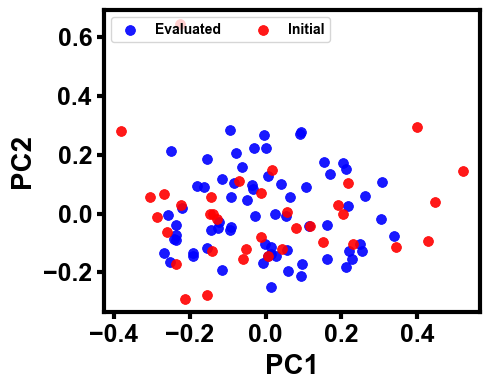

In [10]:
fig, ax = plt.subplots(figsize=(5, 4))
markers = ['o', 's', '*', 'v']
#['*', 's', 'o', 'v']
sns.scatterplot(data=df_eval, x='pca1', y='pca2',
                markers='*', edgecolor=None, color='blue',
                alpha=0.9, s=50,  label='Evaluated')

sns.scatterplot(data=df_init, x='pca1', y='pca2',
                markers=markers, edgecolor=None, color='red',
                alpha=0.9, s=50,  label='Initial')

ax.set_xlabel('PC1', fontsize='20', fontname='Arial',
              fontweight='bold', labelpad=5)
ax.set_ylabel('PC2', fontsize='20', fontname='Arial',
              fontweight='bold', labelpad=5)

ax.tick_params(direction='out', length=5, width=3, colors='black',
               grid_alpha=1, labelsize='18')

[i.set_linewidth(3) for i in ax.spines.values()]
plt.legend(ncol=2, loc='upper left')
plt.tight_layout()
#plt.title ('per {}, rand {}'.format(per, rand))
#plt.ylim(-25, 45)
plt.savefig('eval_init_samples_pca.jpeg', dpi=500)


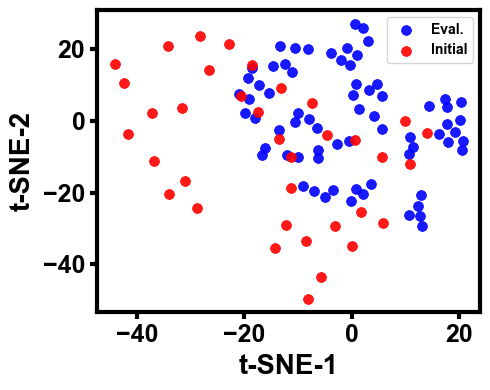

In [11]:
fig, ax = plt.subplots(figsize=(5, 4))
markers = ['o', 's', '*', 'v']
#['*', 's', 'o', 'v']
sns.scatterplot(data=df_eval, x='tsne1', y='tsne2',
                markers='*', edgecolor=None, color='blue',
                alpha=0.9, s=50, label='Eval.')

sns.scatterplot(data=df_init, x='tsne1', y='tsne2',
                markers=markers, edgecolor=None, color='red',
                alpha=0.9, s=50, label='Initial')
plt.legend()

ax.set_xlabel('t-SNE-1', fontsize='20', fontname='Arial',
              fontweight='bold', labelpad=5)
ax.set_ylabel('t-SNE-2', fontsize='20', fontname='Arial',
              fontweight='bold', labelpad=5)

ax.tick_params(direction='out', length=5, width=3, colors='black',
               grid_alpha=1, labelsize='18')

[i.set_linewidth(3) for i in ax.spines.values()]

plt.tight_layout()
#plt.title ('per {}, rand {}'.format(per, rand))
#plt.ylim(-25, 45)
plt.savefig('eval_init_samples_tsne.jpeg', dpi=500)


In [12]:
# PCA Dimension Reduction
pca = PCA(n_components=2)
x_pca = pca.fit_transform(X)

df['pca1'] = x_pca[:, 0]
df['pca2'] = x_pca[:, 1]



Compiled modules for significant speedup can not be used!
https://pymoo.org/installation.html#installation

To disable this warning:
from pymoo.configuration import Configuration
Configuration.show_compile_hint = False



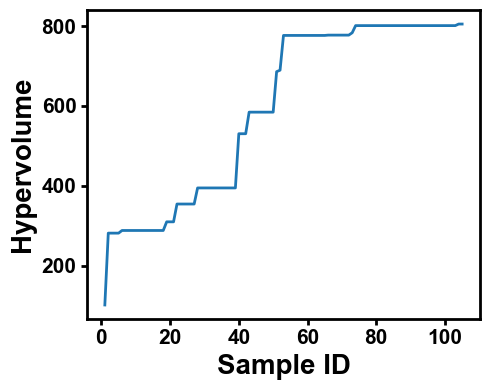

In [13]:
Strength = -df['Tensile_Strength(MPa)']
Toughness = -df['Toughness(MJ/m3)']
Y = []
for i, j in zip(Strength, Toughness):
    Y.append([i, j])
Y = np.array(Y)
plot_performance_metric(Y, ['min', 'min'])


In [14]:
# calculate the Pareto Front
pareto = find_pareto_front(Y)
pareto[:, 0]


array([-49.99, -32.03, -31.22, -17.82, -15.1 ])

In [15]:
df['Toughness(MJ/m3)']


0      2.33
1     12.47
2      0.69
3      0.70
4      2.15
      ...  
65     0.62
66     1.33
67     7.58
68     0.29
69    18.29
Name: Toughness(MJ/m3), Length: 106, dtype: float64

In [16]:
pareto_id = []
for i in range(len(df)):
    if df['Tensile_Strength(MPa)'].iloc[i] in -pareto[:, 0]:
        if df['Toughness(MJ/m3)'].iloc[i] in -pareto[:, 1]:
            pareto_id.append(i)
df_pareto = df.iloc[pareto_id]
df_pareto['Toughness(MJ/m3)']


14    25.76
16    22.56
36    25.02
37     2.75
67     7.58
Name: Toughness(MJ/m3), dtype: float64

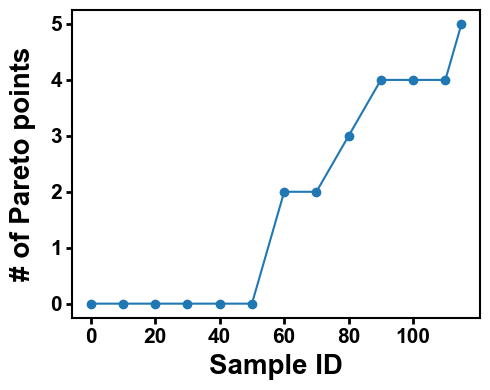

In [30]:
# manually find what iteration each pareto discoverd
# array([[-49.99,  -2.75] --> 81
#       [-32.03,  -7.58]--> 113
#      [-31.22, -22.56] --> 60
#      [-17.82, -25.02] --> 80
#      [-15.1 , -25.76]]) --> 58
fig, ax = plt.subplots(figsize=(5, 4))
iterations = np.arange(0, 121, 10)
iterations[-1] = 115
pareto_cont = [0, 0, 0, 0, 0, 0, 2, 2, 3, 4, 4, 4, 5]
plt.scatter(iterations, pareto_cont)
plt.plot(iterations, pareto_cont)

plt.xticks([0, 20, 40, 60, 80, 100,])
ax.set_xlabel('Sample ID', fontsize='20', fontname='Arial',
              fontweight='bold', labelpad=5)
ax.set_ylabel('# of Pareto points', fontsize='20', fontname='Arial',
              fontweight='bold', labelpad=10)

ax.tick_params(direction='out', length=4, width=2, colors='black',
               grid_alpha=1, labelsize='15')

[i.set_linewidth(1.5) for i in ax.spines.values()]
plt.tight_layout()
plt.savefig('numParet_iters.png', dpi=500)


In [29]:
iterations.shape

(13,)

In [18]:
iterations = np.arange(50, 121, 10)
iterations


array([ 50,  60,  70,  80,  90, 100, 110, 120])

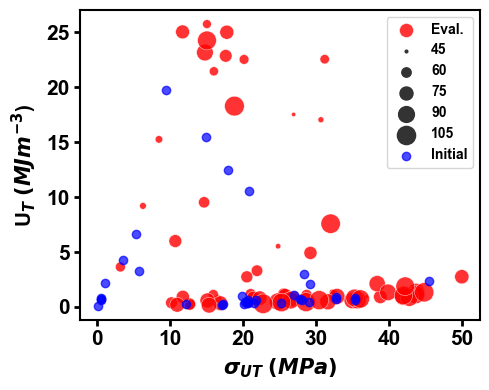

In [19]:
fig, ax = plt.subplots(figsize=(5, 4))
sns.scatterplot(x='Tensile_Strength(MPa)', y='Toughness(MJ/m3)',
                size='sample', color='red', sizes=(1, 200), label='Eval.',
                alpha=.8, palette=["red"], data=df_eval)
plt.scatter(df_init['Tensile_Strength(MPa)'],
            df_init['Toughness(MJ/m3)'], label='Initial',
            alpha=0.7, color='blue',)
plt.legend()
# plt.legend(['','','','','',
#           'Eval.','Init.'])


ax.set_xlabel('$\sigma$$_{UT}$ $(MPa)$', fontsize='15',
              fontname='Arial', fontweight='bold', labelpad=5)
ax.set_ylabel('U$_T$ $({MJ}{m^{-3}}$)', fontsize='15',
              fontname='Arial', fontweight='bold', labelpad=5)

ax.tick_params(direction='out', length=4, width=2, colors='black',
               grid_alpha=1, labelsize='15')
#plt.scatter (-pareto[:, 0], -pareto[:, 1], facecolors='none', edgecolors='black')

[i.set_linewidth(1.5) for i in ax.spines.values()]
plt.tight_layout()
plt.savefig('evaluate_init.png', dpi=500)


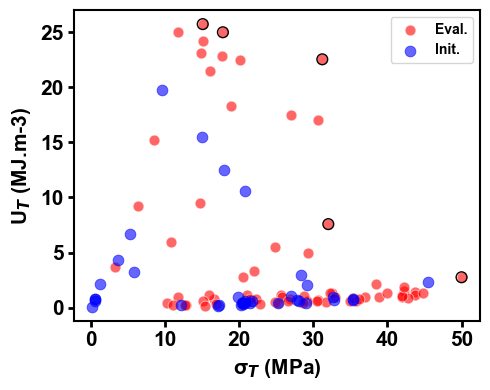

In [21]:
fig, ax = plt.subplots(figsize=(5, 4))
sns.scatterplot(x='Tensile_Strength(MPa)', y='Toughness(MJ/m3)',
                color='red', s=60, label='Eval.',
                alpha=.6, palette=["blue"], data=df_eval)

sns.scatterplot(x='Tensile_Strength(MPa)', y='Toughness(MJ/m3)',
                color='blue', s=60, label='Init.', edgecolor=None,
                alpha=.6, palette=["red"], data=df_init)
plt.legend()
ax.set_xlabel('σ$_{T}$ (MPa)', fontsize='15',
              fontname='Arial', fontweight='bold', labelpad=5)
ax.set_ylabel(r'U$_T$ (MJ.m-3)', fontsize='15',
              fontname='Arial', fontweight='bold', labelpad=5)

ax.tick_params(direction='out', length=4, width=2, colors='black',
               grid_alpha=1, labelsize='15')
plt.scatter(-pareto[:, 0], -pareto[:, 1], facecolors='none',
            s=60, edgecolors='black', marker='o', alpha=1,)
plt.legend()
pareto_df = pd.DataFrame({})
pareto_df['strength'] = -pareto[:, 0]
pareto_df['toughness'] = -pareto[:, 1]
pareto_df_sort_str = pareto_df.sort_values(by='strength')
new_iters = np.arange(pareto_df_sort_str['strength'].iloc[0],
                      pareto_df_sort_str['strength'].iloc[-1], 0.1)

gfg_str = make_interp_spline(pareto_df_sort_str['strength'],
                             pareto_df_sort_str['toughness'], k=1)
strength_new = gfg_str(new_iters)
#plt.plot(new_iters, strength_new, '--k')

[i.set_linewidth(1.5) for i in ax.spines.values()]
plt.tight_layout()
plt.savefig('evaluate_init_pareto_nosize.png', dpi=500)


In [95]:

print(u'\u1d40')

ᵀ


In [96]:
def calc_hypervolume(Y, ref_point, obj_type=None):
    '''
    Calculate hypervolume
    '''
    #Y = convert_minimization(Y, obj_type)

    return Hypervolume(ref_point=ref_point).calc(Y)


hypervolume = calc_hypervolume(Y, (0, 0), )
print(hypervolume)


814.8641999999999


In [97]:
Strength = df_init['Tensile_Strength(MPa)']
Toughness = df_init['Toughness(MJ/m3)']
Y_initial = []
for i, j in zip(Strength, Toughness):
    Y_initial.append([i, j])
Y_initial = np.array(Y_initial)
Y_initial


array([[45.51,  2.33],
       [17.95, 12.47],
       [32.74,  0.69],
       [27.81,  0.7 ],
       [ 1.2 ,  2.15],
       [28.33,  2.97],
       [20.54,  0.32],
       [27.03,  1.05],
       [35.42,  0.64],
       [21.52,  0.4 ],
       [20.23,  0.23],
       [29.07,  0.45],
       [20.54,  0.41],
       [17.16,  0.17],
       [19.83,  0.99],
       [29.19,  2.06],
       [ 5.35,  6.68],
       [32.72,  0.93],
       [20.8 , 10.57],
       [25.27,  0.38],
       [20.76,  0.62],
       [14.97, 15.49],
       [20.74,  0.37],
       [ 5.83,  3.27],
       [20.33,  0.41],
       [28.13,  0.59],
       [21.79,  0.6 ],
       [ 9.55, 19.8 ],
       [ 3.67,  4.28],
       [ 0.57,  0.75],
       [ 0.53,  0.77],
       [ 0.59,  0.6 ],
       [ 0.2 ,  0.09],
       [35.33,  0.78],
       [17.35,  0.24],
       [12.22,  0.24]])

In [98]:
Strength = df_eval['Tensile_Strength(MPa)']
Toughness = df_eval['Toughness(MJ/m3)']
Y_eval = []
for i, j in zip(Strength, Toughness):
    Y_eval.append([i, j])
Y_eval = np.array(Y_eval)
Y_eval


array([[29.22,  0.62],
       [30.68,  0.7 ],
       [36.98,  0.94],
       [26.97, 17.53],
       [32.56,  1.35],
       [24.84,  5.53],
       [30.7 , 17.05],
       [32.28,  1.33],
       [ 6.34,  9.2 ],
       [20.44,  0.53],
       [ 8.53, 15.26],
       [16.59,  0.75],
       [21.56,  0.59],
       [42.27,  1.49],
       [15.1 , 25.76],
       [16.05, 21.46],
       [31.22, 22.56],
       [20.18, 22.54],
       [ 3.25,  3.64],
       [15.97,  1.12],
       [12.83,  0.23],
       [21.08,  1.18],
       [28.74,  1.09],
       [14.71,  9.53],
       [21.95,  3.3 ],
       [10.24,  0.38],
       [20.56,  2.74],
       [12.7 ,  0.26],
       [25.61,  1.15],
       [17.67, 22.87],
       [10.77,  6.  ],
       [29.27,  4.92],
       [11.8 ,  0.91],
       [38.83,  0.92],
       [21.46,  0.81],
       [11.76, 25.05],
       [17.82, 25.02],
       [49.99,  2.75],
       [22.32,  0.8 ],
       [16.94,  0.34],
       [11.03,  0.2 ],
       [15.17,  0.59],
       [25.8 ,  0.97],
       [26.

In [99]:
Y = -Y


In [100]:
np.min(Y_eval[:, 0])


3.25

In [101]:
(np.sqrt(1e-3), np.sqrt(1e3))


(0.03162277660168379, 31.622776601683793)

In [102]:
n_var = 5
nu1 = 1
nu2 = 1
main_kernel1 = Matern(length_scale=1*np.ones(n_var),
                      length_scale_bounds=(np.sqrt((13e-1)), np.sqrt(5e5)), nu=0.5*nu1)

main_kernel2 = Matern(length_scale=2*np.ones(n_var),
                      length_scale_bounds=(np.sqrt((1.65e-1)), np.sqrt(1e3)), nu=0.5*nu2)

kernel1 = ConstantKernel(constant_value=1.0,
                         constant_value_bounds=(np.sqrt(1e-5), np.sqrt(1000))) * main_kernel1 + \
    ConstantKernel(constant_value=1.0,
                   constant_value_bounds=(np.exp(-100), np.exp(0)))

kernel2 = ConstantKernel(constant_value=1.0,
                         constant_value_bounds=(np.sqrt(0.01), np.sqrt(35))) * main_kernel2

kernel2 = ConstantKernel(constant_value=1.0,
                         constant_value_bounds=(np.sqrt(1e-5), np.sqrt(100))) * \
    main_kernel2 + \
    ConstantKernel(constant_value=1.0,
                   constant_value_bounds=(np.exp(-10), np.exp(0)))
# RBF kernel
#main_kernel = RBF(length_scale=0.01*np.ones(n_var), length_scale_bounds=(np.sqrt(1e-3), np.sqrt(1e5)))
#kernel = ConstantKernel(constant_value=1.0, constant_value_bounds=(np.sqrt(6e-1), np.sqrt(0.2e3))) * main_kernel
#kernel = ConstantKernel(constant_value=1.0, constant_value_bounds=(np.sqrt(6e-1), np.sqrt(0.2e2))) * RBF(length_scale=10, length_scale_bounds=(0.0, 10.0)) + 50*main_kernel


In [103]:
def constrained_optimization(obj_func, initial_theta, bounds):
    '''
    Customized version of constrained optimization to avoid convergence warning.
    '''
    opt_res = minimize(obj_func, initial_theta,
                       method="L-BFGS-B", jac=True, bounds=bounds,)
    # NOTE: Temporarily disable the checking below because of the numerical instability sometimes.
    _check_optimize_result("lbfgs", opt_res)
    return opt_res.x, opt_res.fun


gpr_strength = GaussianProcessRegressor(
    kernel=kernel1,
    optimizer=constrained_optimization,
    alpha=0.2
)
gpr_toughness = GaussianProcessRegressor(
    kernel=kernel1,
    optimizer=constrained_optimization,
    alpha=0.3
)


In [162]:
range(0, len(Y_eval))

range(0, 70)

In [163]:
errors_strength0 = []
pred_strength = []
sdt_strength = []
i = 0
X = np.array(X)
Y = np.array(Y)
for i in range(0, len(Y_eval)):
    gpr_strength = gpr_strength.fit(
        X[0:len(Y_initial)+i, :], Y[0:len(Y_initial)+i, 0])
    x_next = np.array(X[len(Y_initial) + i, :])
    x_next = x_next.reshape(1, 5)
    y_next = np.array(Y[len(Y_initial) + i, 0])
    y_next = y_next.reshape(1, 1)
    try:
        y_nexts = np.array(Y[len(Y_initial) + i: len(Y_initial) + i+5, 0])
        y_nexts = y_nexts.reshape(5, 1)
        x_nexts = np.array(X[len(Y_initial) + i: len(Y_initial) + i+5, :])
        x_nexts = x_nexts.reshape(5, 5)
        score_strength = gpr_strength.score(x_nexts, y_nexts)
        #print (score_strength)
    except:
        pass

    gpr_strength_predict = gpr_strength.predict(x_next, return_std=True)
    pred_strength.append([gpr_strength_predict[0][0], y_next[0][0]])
    sdt_strength.append(gpr_strength_predict[1][0])

    #print (gpr_strength_predict, y_next)

    error = abs(gpr_strength_predict[0] - y_next)/y_next

    #print (error)
    errors_strength0.append(error)

errors_toughness0 = []
pred_toughness = []
sdt_toughness = []
for i in range(0, len(Y_eval)):
    gpr_toughness = gpr_toughness.fit(
        X[0:len(Y_initial)+i, :], Y[0:len(Y_initial)+i, 1])

    x_next = np.array(X[len(Y_initial) + i, :])
    x_next = x_next.reshape(1, 5)
    y_next = np.array(Y[len(Y_initial) + i, 1])
    y_next = y_next.reshape(1, 1)
    try:
        y_nexts = np.array(Y[len(Y_initial)+i: len(Y_initial)+i+5, 1])
        y_nexts = y_nexts.reshape(5, 1)
        x_nexts = np.array(X[len(Y_initial)+i: len(Y_initial)+i+5, :])
        x_nexts = x_nexts.reshape(5, 5)
        score_toughness = gpr_toughness.score(x_nexts, y_nexts)
        #print (score_toughness)
    except:
        pass

    gpr_toughness_predict = gpr_toughness.predict(x_next, return_std=True)
    pred_toughness.append([gpr_toughness_predict[0][0], y_next[0][0]])
    sdt_toughness.append(gpr_toughness_predict[1][0])
    # print (gpr_toughness_ppred_strength
    # to not divide by a <1 number
    error = abs(gpr_toughness_predict[0] - y_next)/(y_next+1)
    errors_toughness0.append(error)

[gpr_toughness_predict[0], y_next[0][0]]


/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified upper bound 31.622776601683793. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1.140175425099138. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 1 of parameter k1__k2__length_scale is close to the specified lower bound 1.140175425099138. Decreasing the bound and calling fit again may find a

[array([2.30827327]), 18.29]

PearsonRResult(statistic=0.490878497091275, pvalue=1.600720075423631e-05)
0.167130673353434
PearsonRResult(statistic=0.6240555845252583, pvalue=7.838835192848658e-09)
0.3840806856476847


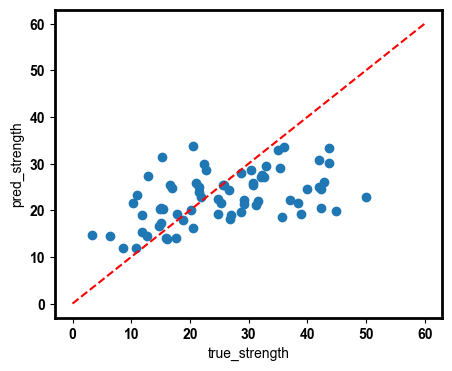

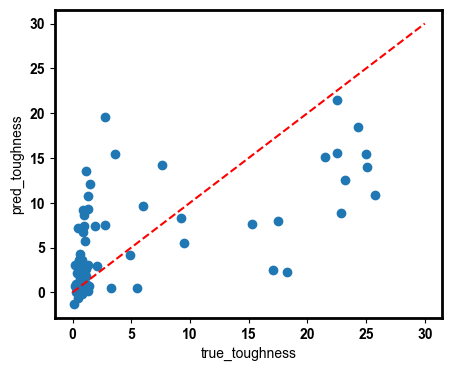

In [164]:
fig, ax = plt.subplots(figsize=(5, 4))
start_index = 0
end_index = 100
# pred_strength = [gp_pred, true_value]
pred_strength = np.array(pred_strength)
plt.scatter(pred_strength[start_index:end_index, 1],
            pred_strength[start_index:end_index, 0])
plt.xlabel('true_strength')
plt.ylabel('pred_strength')
plt.plot([0, 60], [0, 60], '--r')
# best rho = 0.496, r2 = 0.165
print(pearsonr(pred_strength[start_index:end_index,
      0], pred_strength[start_index:end_index, 1]))
print(r2_score(pred_strength[start_index:end_index,
      1], pred_strength[start_index:end_index, 0], ))
fig, ax = plt.subplots(figsize=(5, 4))
# pred_strength = [gp_pred, true_value]
pred_toughness = np.array(pred_toughness)
pred_toughness[:, 0]
plt.scatter(pred_toughness[start_index:end_index, 1],
            pred_toughness[start_index:end_index, 0])
plt.plot([0, 30], [0, 30], '--r')
plt.xlabel('true_toughness')
plt.ylabel('pred_toughness')
# best rho = 0.624, r2 = 0.384
print(pearsonr(pred_toughness[start_index:end_index, 0],
               pred_toughness[start_index:end_index, 1]))
print(r2_score(pred_toughness[start_index:end_index, 1],
               pred_toughness[start_index:end_index, 0]))


In [203]:
x1 = np.arange(44,86)
x2 = np.arange(87,103)
x3 = np.arange(104, 116)
x12 = np.concatenate((x1, x2))
x = np.concatenate((x12, x3))
x

array([ 44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,  56,
        57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
        70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,
        83,  84,  85,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,
        97,  98,  99, 100, 101, 102, 104, 105, 106, 107, 108, 109, 110,
       111, 112, 113, 114, 115])

In [209]:
iters = list(np.arange(n-1, len(Y_eval), n))
iters

[4, 9, 14, 19, 24, 29, 34, 39, 44, 49, 54, 59, 64, 69]

In [212]:
x_iter = x[iters]
x_iter

array([ 48,  53,  58,  63,  68,  73,  78,  83,  89,  94,  99, 105, 110,
       115])

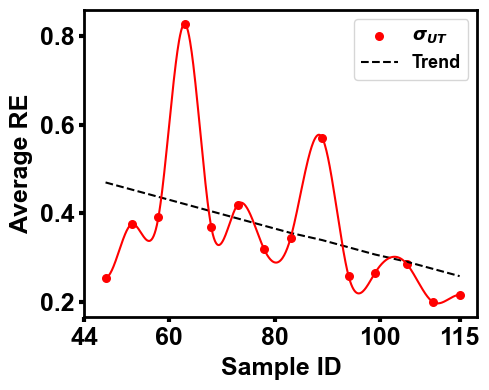

In [253]:
# 86, 103
errors_strength_ = errors_strength0.copy()
errors_toughness_ = errors_toughness0.copy()
errors_strength = np.array(errors_strength0).reshape(len(Y_eval), 1)
errors_toughness = np.array(errors_toughness0).reshape(len(Y_eval), 1)

# calculates the average over every n evaluation
n = 5
iters = list(np.arange(0, len(Y_eval), n))
avgerrors_strength = np.average(errors_strength.reshape(-1, n), axis=1)
#avgerrors_strength[8] = 0.4
avgerrors_toughness = np.average(errors_toughness.reshape(-1, n), axis=1)

new_iters = np.arange(48, 115.1, 0.1)
gfg_str = make_interp_spline(x_iter, avgerrors_strength, bc_type='clamped',)
# bc_type='clamped', k=3)#k=2)
gfg_tough = make_interp_spline(x_iter, avgerrors_toughness, bc_type='clamped', )


strength_new = gfg_str(new_iters)
toughness_new = gfg_tough(new_iters)

fig, ax = plt.subplots(figsize=(5, 4))
plt.scatter(x_iter,
            avgerrors_strength, s=30, alpha=1, color='red')
# calculate equation for trendline
x = np.arange(0, len(Y_eval), n) + n + 43
x = list(x)
y = avgerrors_strength
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
# add trendline to plot
plt.plot(x_iter, p(x), '--k')

# plt.scatter (list(np.arange(0, len(Y_eval), n) + n),
#         avgerrors_toughness, s=30, alpha=0.7, color='blue')

# calculate equation for trendline
x = (np.arange(0, len(Y_eval), n) + n)
x = x + 43
x = list(x)
y = avgerrors_toughness
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
# add trendline to plot
#plt.plot(x, p(x), '--b')

plt.plot(new_iters , strength_new, color='red', label='$\sigma$$_{T}$', alpha=1)
#plt.plot(new_iters + n, toughness_new, color='blue', label='Toughness', alpha=0.7)
plt.legend(['$\sigma$$_{UT}$', 'Trend'], fontsize=13)
ax.set_xlabel('Sample ID', fontsize='18', fontname='Arial',
              fontweight='bold', labelpad=5)
ax.set_ylabel('Average RE', fontsize='18', fontname='Arial',
              fontweight='bold', labelpad=5)

ax.tick_params(direction='out', length=3.5, width=3, colors='black',
               grid_alpha=1, labelsize='18')
[i.set_linewidth(2) for i in ax.spines.values()]
ticks = [ 44,  60,  80,  100,  115]
plt.xticks(ticks)
#plt.legend([], title='$\sigma$$_{UT}$', frameon=False, title_fontsize=15)#fontname='Arial',)
#plt.ylim((0, 1))
plt.tight_layout()
plt.savefig('AverageRE_strength.png', dpi=500)


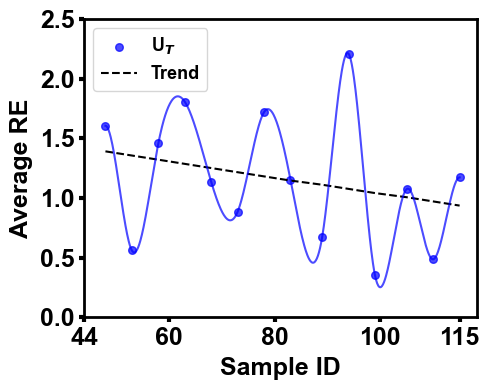

In [257]:
errors_strength_ = errors_strength0.copy()
errors_toughness_ = errors_toughness0.copy()
errors_strength = np.array(errors_strength0).reshape(len(Y_eval), 1)
errors_toughness = np.array(errors_toughness0).reshape(len(Y_eval), 1)

# calculates the average over every n evaluation
n = 5
iters = list(np.arange(0, len(Y_eval), n))
avgerrors_strength = np.average(errors_strength.reshape(-1, n), axis=1)
#avgerrors_strength[8] = 0.4
avgerrors_toughness = np.average(errors_toughness.reshape(-1, n), axis=1)

new_iters = np.arange(48, 115.1, 0.1)
gfg_str = make_interp_spline(x_iter, avgerrors_strength, bc_type='natural',)
# bc_type='clamped', k=3)#k=2)
gfg_tough = make_interp_spline(
    x_iter, avgerrors_toughness, k=3, bc_type='clamped', )


strength_new = gfg_str(new_iters)
toughness_new = gfg_tough(new_iters)

fig, ax = plt.subplots(figsize=(5, 4))
# plt.scatter (list(np.arange(0, len(Y_eval), n) + n),
#          avgerrors_strength, s=30, alpha=1, color='red')
# calculate equation for trendline
x = list(np.arange(0, len(Y_eval), n) + n)
y = avgerrors_strength
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
# add trendline to plot
#plt.plot(x, p(x), '--r')

plt.scatter(x_iter,
            avgerrors_toughness, s=30, alpha=0.7, color='blue')

# calculate equation for trendline
x = (np.arange(0, len(Y_eval), n) + n + 39)
x = list(x)
y = avgerrors_toughness
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
# add trendline to plot
plt.plot(x_iter, p(x), '--k')

#plt.plot(new_iters + n, strength_new, color='red', label='Strength', alpha=0.7)
plt.plot(new_iters, toughness_new,
         color='blue', label='Toughness', alpha=0.7)
plt.legend(['U$_T$', 'Trend'], fontsize=13)
ax.set_xlabel('Sample ID', fontsize='18', fontname='Arial',
              fontweight='bold', labelpad=5)
ax.set_ylabel('Average RE', fontsize='18', fontname='Arial',
              fontweight='bold', labelpad=5)

ax.tick_params(direction='out', length=3.5, width=3, colors='black',
               grid_alpha=1, labelsize='18')
[i.set_linewidth(2) for i in ax.spines.values()]
ticks = [ 44,  60,  80,  100,  115]
plt.xticks(ticks)

plt.ylim((0, 2.5))

plt.tight_layout()
plt.savefig('AverageRE_toughness.png', dpi=500)


In [245]:
new_iters

array([ 48. ,  48.1,  48.2,  48.3,  48.4,  48.5,  48.6,  48.7,  48.8,
        48.9,  49. ,  49.1,  49.2,  49.3,  49.4,  49.5,  49.6,  49.7,
        49.8,  49.9,  50. ,  50.1,  50.2,  50.3,  50.4,  50.5,  50.6,
        50.7,  50.8,  50.9,  51. ,  51.1,  51.2,  51.3,  51.4,  51.5,
        51.6,  51.7,  51.8,  51.9,  52. ,  52.1,  52.2,  52.3,  52.4,
        52.5,  52.6,  52.7,  52.8,  52.9,  53. ,  53.1,  53.2,  53.3,
        53.4,  53.5,  53.6,  53.7,  53.8,  53.9,  54. ,  54.1,  54.2,
        54.3,  54.4,  54.5,  54.6,  54.7,  54.8,  54.9,  55. ,  55.1,
        55.2,  55.3,  55.4,  55.5,  55.6,  55.7,  55.8,  55.9,  56. ,
        56.1,  56.2,  56.3,  56.4,  56.5,  56.6,  56.7,  56.8,  56.9,
        57. ,  57.1,  57.2,  57.3,  57.4,  57.5,  57.6,  57.7,  57.8,
        57.9,  58. ,  58.1,  58.2,  58.3,  58.4,  58.5,  58.6,  58.7,
        58.8,  58.9,  59. ,  59.1,  59.2,  59.3,  59.4,  59.5,  59.6,
        59.7,  59.8,  59.9,  60. ,  60.1,  60.2,  60.3,  60.4,  60.5,
        60.6,  60.7,

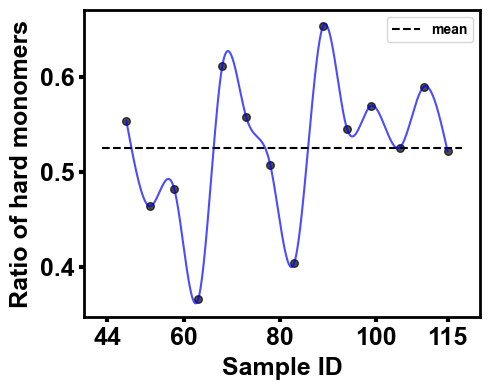

In [270]:
x_eval = np.array(x_eval)
# calculates the average over every n evaluation
n = 5
iters = list(np.arange(0, len(Y_eval), n))
avgerrors_strength = np.average(pred_strength[:, 0].reshape(-1, n), axis=1)

x_eval_hard = x_eval[:, 2].ravel() + x_eval[:, 3].ravel() + x_eval[:, 4].ravel() + \
    np.round(1-(x_eval[:, 2].ravel() + x_eval[:, 3].ravel() + x_eval[:,
             4].ravel() + x_eval[:, 0].ravel() + x_eval[:, 1].ravel()), 2)
#x_eval_hard = 1-(x_eval [:, 0].ravel() + x_eval [:, 1].ravel() )
avg_x_eval_hard = np.average(x_eval_hard.reshape(-1, n), axis=1)
#plt.scatter (np.arange(0, len(avg_x_eval_hard)), avg_x_eval_hard,)

fig, ax = plt.subplots(figsize=(5, 4))
plt.scatter(x_iter,
            avg_x_eval_hard, s=30, alpha=0.7, color='black')

new_iters = np.arange(48, 115.1, 0.1)
gfg_str = make_interp_spline(
    x_iter, avg_x_eval_hard, k=3, bc_type='natural', check_finite=False)

strength_new = gfg_str(new_iters)
plt.plot([0+43, 75+43], [np.mean(x_eval_hard), np.mean(
    x_eval_hard)], '--k', label='mean')
plt.legend()
plt.plot(new_iters, strength_new, color='blue', label='Strength', alpha=0.7)
plt.xlabel('Sample ID')
plt.ylabel('Ratio of hard monomers')

ax.set_xlabel('Sample ID', fontsize='18', fontname='Arial',
              fontweight='bold', labelpad=5)
ax.set_ylabel('Ratio of hard monomers', fontsize='18',
              fontname='Arial', fontweight='bold', labelpad=5)

ax.tick_params(direction='out', length=3.5, width=3, colors='black',
               grid_alpha=1, labelsize='18')
[i.set_linewidth(2) for i in ax.spines.values()]

ticks = [ 44,  60,  80,  100,  115]
plt.xticks(ticks)

plt.tight_layout()
plt.savefig('hardmonomers_iter.png', dpi=500)


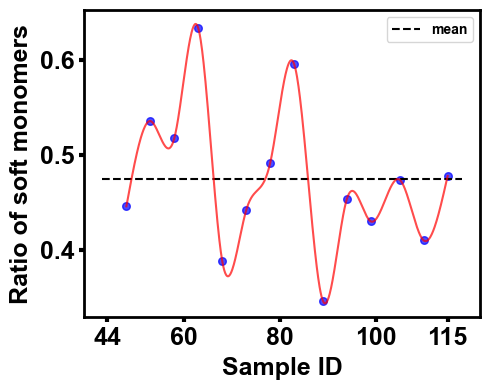

In [272]:
x_eval = np.array(x_eval)
# calculates the average over every n evaluation
n = 5
iters = list(np.arange(0, len(Y_eval), n))
avgerrors_strength = np.average(pred_strength[:, 0].reshape(-1, n), axis=1)
x_eval_soft = x_eval[:, 0].ravel() + x_eval[:, 1].ravel()
avg_x_eval_soft = np.average(x_eval_soft.reshape(-1, n), axis=1)
#plt.scatter (np.arange(0, len(avg_x_eval_soft)), avg_x_eval_soft,)

fig, ax = plt.subplots(figsize=(5, 4))
plt.scatter(x_iter,
            avg_x_eval_soft, s=30, alpha=0.7, color='blue')

new_iters = np.arange(48, 115.1, 0.1)
gfg_str = make_interp_spline(
    x_iter, avg_x_eval_soft, k=3, bc_type='natural', check_finite=False)

strength_new = gfg_str(new_iters)
plt.plot([0+43, 75+43], [np.mean(x_eval_soft), np.mean(
    x_eval_soft)], '--k', label='mean')
plt.legend()
plt.plot(new_iters, strength_new, color='red', label='Strength', alpha=0.7)
plt.xlabel('Sample ID')
plt.ylabel('Ratio of soft monomers')

ax.set_xlabel('Sample ID', fontsize='18', fontname='Arial',
              fontweight='bold', labelpad=5)
ax.set_ylabel('Ratio of soft monomers', fontsize='18',
              fontname='Arial', fontweight='bold', labelpad=5)

ax.tick_params(direction='out', length=3.5, width=3, colors='black',
               grid_alpha=1, labelsize='18')
[i.set_linewidth(2) for i in ax.spines.values()]
ticks = [ 44,  60,  80,  100,  115]
plt.xticks(ticks)
plt.tight_layout()
plt.savefig('softmonomers_iter.png', dpi=500)


In [48]:
gpr_strength.fit(X, Y[:, 0],)
gpr_toughness.fit(X, Y[:, 1])

/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/gaussian_process/kernels.py:430: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified upper bound 31.622776601683793. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1.140175425099138. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 1 of parameter k1__k2__length_scale is close to the specified lower bound 1.140175425099138. Decreasing the bound and calling fit again may find a

GaussianProcessRegressor(alpha=0.3,
                         kernel=1**2 * Matern(length_scale=[1, 1, 1, 1, 1], nu=0.5) + 1**2,
                         optimizer=<function constrained_optimization at 0x7f2bbc7995e0>)

/tmp/ipykernel_6210/4010842294.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pareto['soft'] = df_pareto['R1(HA)'] + df_pareto['R2(IA)']
/tmp/ipykernel_6210/4010842294.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pareto['hard'] = df_pareto['R3(NVP)'] + df_pareto['R4(AA)'] +\


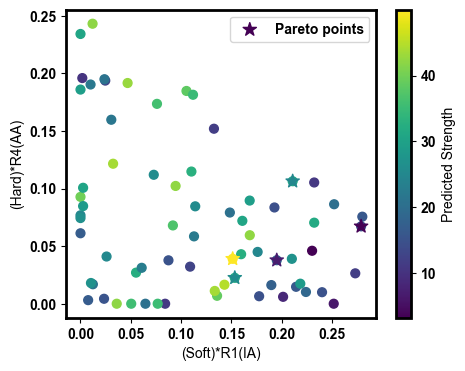

In [49]:
# plot each two of the input paramters for the evaluated samples
n_dims = 5
fig, ax = plt.subplots(1, 1,
                       figsize=(5, 4))
#plt.xlim(0, 1)
#plt.ylim(0, 1)
df_eval['soft'] = df_eval['R1(HA)'] + df_eval['R2(IA)']
df_eval['hard'] = df_eval['R3(NVP)'] + df_eval['R4(AA)'] +\
    df_eval['R5(HEAA)']

df_pareto['soft'] = df_pareto['R1(HA)'] + df_pareto['R2(IA)']
df_pareto['hard'] = df_pareto['R3(NVP)'] + df_pareto['R4(AA)'] +\
    df_pareto['R5(HEAA)']

Ratios = ['R1(HA)',	'R2(IA)',	'R3(NVP)',	'R4(AA)',
          'R5(HEAA)',	'R6(IBOA)', 'soft', 'hard']
""" 
cs = ax.scatter('soft', 'hard',
                c='Tensile_Strength(MPa)', data=df_eval,
                s=40, cmap='viridis')
"""
cs = ax.scatter(df_eval['soft']*df_eval['R2(IA)'],
                df_eval['hard']*df_eval['R5(HEAA)'],
                c=df_eval['Tensile_Strength(MPa)'],
                s=40, cmap='viridis')

fig.colorbar(cs, ax=ax, label='Predicted Strength')
#plt.plot([0, 1], [1, 0])
""" 
ax.scatter('soft', 'hard', data=df_pareto, c='Tensile_Strength(MPa)',
           s=200, marker='*')
"""
ax.scatter(df_pareto['soft']*df_pareto['R2(IA)'],
           df_pareto['hard']*df_pareto['R5(HEAA)'],
           c=df_pareto['Tensile_Strength(MPa)'],
           s=100, marker='*', label='Pareto points')
plt.xlabel('(Soft)*R1(IA)')
plt.ylabel('(Hard)*R4(AA)')
plt.legend()


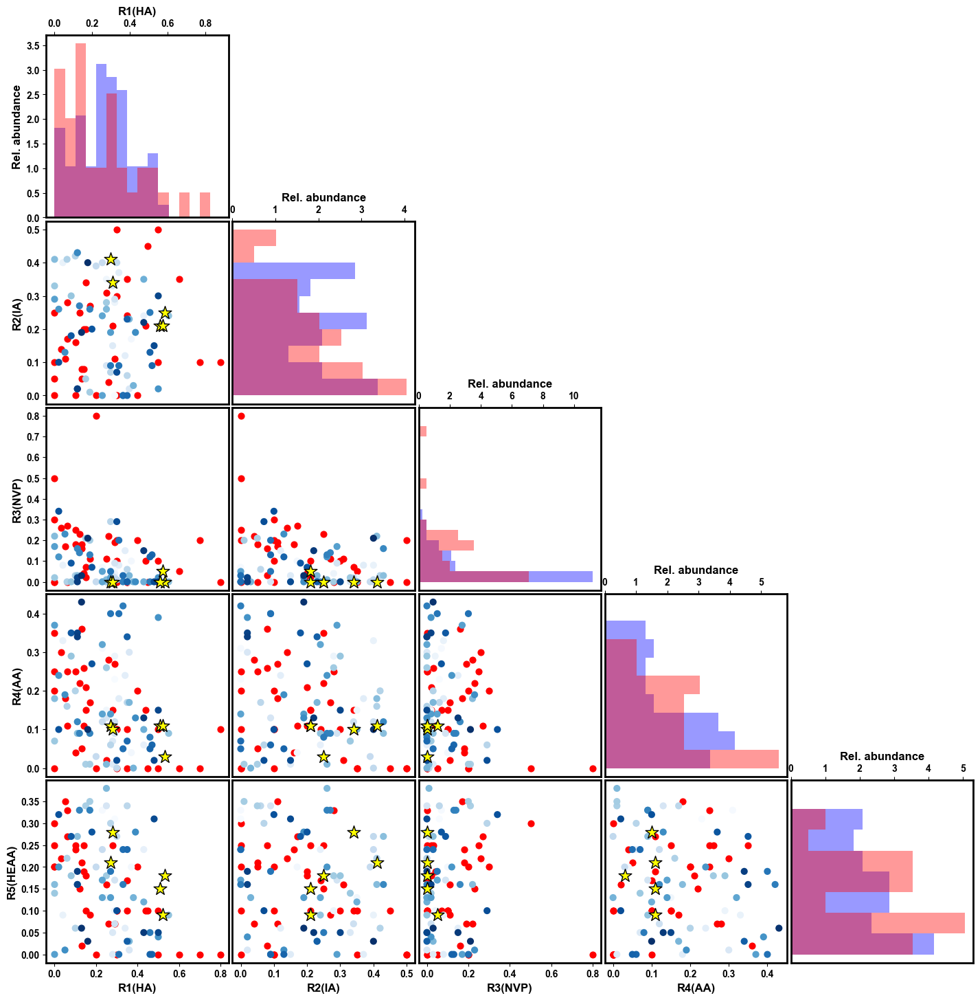

In [50]:
n_dims = 5
step = 0.055
fig, ax = plt.subplots(n_dims, n_dims,
                       figsize=(3 * n_dims, 3 * n_dims))
fig.subplots_adjust(left=0.05, right=0.95, bottom=0.05, top=0.95,
                    hspace=0.02, wspace=0.02)
Ratios = ['R1(HA)',	'R2(IA)', 'R3(NVP)',
          'R4(AA)', 'R5(HEAA)', 'R6(IBOA)']
for i in range(n_dims):
    for j in range(n_dims):
        if i == j:
            if i == 0:
                ax_ = ax[i, j]
                ax_.xaxis.set_label_position("top")
                ax_.xaxis.tick_top()
                ax_.set_xlabel(Ratios[j], fontweight='bold', fontsize=12)
                ax_.set_ylabel('Rel. abundance', fontweight='bold', fontsize=12)
                min = np.min(df_eval[Ratios[j]])
                max = np.max(df_eval[Ratios[j]])
                ax_.hist(Ratios[j], data=df_eval, color='blue', density=True,
                         bins=np.arange(min, max+0.1, step=step), alpha=0.4)

                min = np.min(df_init[Ratios[j]])
                max = np.max(df_init[Ratios[j]])
                ax_.hist(Ratios[j], data=df_init, bins=np.arange(min, max+0.1, step=step),
                         density=True, color='red', alpha=0.4)

            else:
                ax_ = ax[i, j]
                min = np.min(df_eval[Ratios[j]])
                max = np.max(df_eval[Ratios[j]])
                ax_.hist(Ratios[j], data=df_eval, color='blue', density=True,
                         bins=np.arange(min, max+0.1, step=step),
                         orientation='horizontal', alpha=0.4)

                min = np.min(df_init[Ratios[j]])
                max = np.max(df_init[Ratios[j]])
                ax_.hist(Ratios[j], data=df_init, bins=np.arange(min, max+0.1, step=step),
                         density=True, orientation='horizontal', color='red', alpha=0.4)
                if i != 0:
                    ax_.xaxis.set_label_position("top")
                    ax_.xaxis.tick_top()
                    ax_.set_xlabel('Rel. abundance', fontweight='bold', fontsize=12)
                    ax_.set_yticklabels([])
                    ax_.tick_params('y', length=0, width=0, )

                else:
                    ax_.set_ylabel(Ratios[j], fontweight='bold', fontsize=12)
                    ax_.xaxis.set_label_position("top")
                    ax_.xaxis.tick_top()
                    ax_.set_xlabel('Rel. abundance', fontweight='bold', fontsize=12)

        elif i > j:
            ax_ = ax[i, j]
            ax_.scatter(Ratios[j], Ratios[i], c='red',
                        data=df_init, s=40,)
            ax_.scatter(Ratios[j], Ratios[i], c='sample',
                        data=df_eval, s=40, cmap='Blues')
            if j == 0:
                ax_.set_ylabel('{}'.format(Ratios[i]), fontweight='bold', fontsize=12)
                if i != (n_dims-1):
                    ax_.set_xticklabels([])
                    ax_.tick_params('x', length=0, width=0, )
            if i == (n_dims-1):
                ax_.set_xlabel('{}'.format(
                    Ratios[j]), fontweight='bold', fontsize=12)
            if i != (n_dims-1):
                if j != 0:
                    ax_.tick_params('both', length=0, width=0, )
                    ax_.set_xticklabels([])
                    ax_.set_yticklabels([])
            if i == (n_dims-1):
                if j != 0:
                    ax_.tick_params('y', length=0, width=0, )
                    ax_.set_yticklabels([])
            ax_.scatter(Ratios[j], Ratios[i], data=df_pareto,
                        color='yellow', edgecolors='black',
                        s=200, marker='*')
            #print(Ratios[j], Ratios[i])
        if j > i:
            ax_ = ax[i, j]
            ax_.axis("off")
#plt.legend(['Evaluated', 'Initial'])
plt.savefig('hist_all_input.png', dpi=500)


/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(


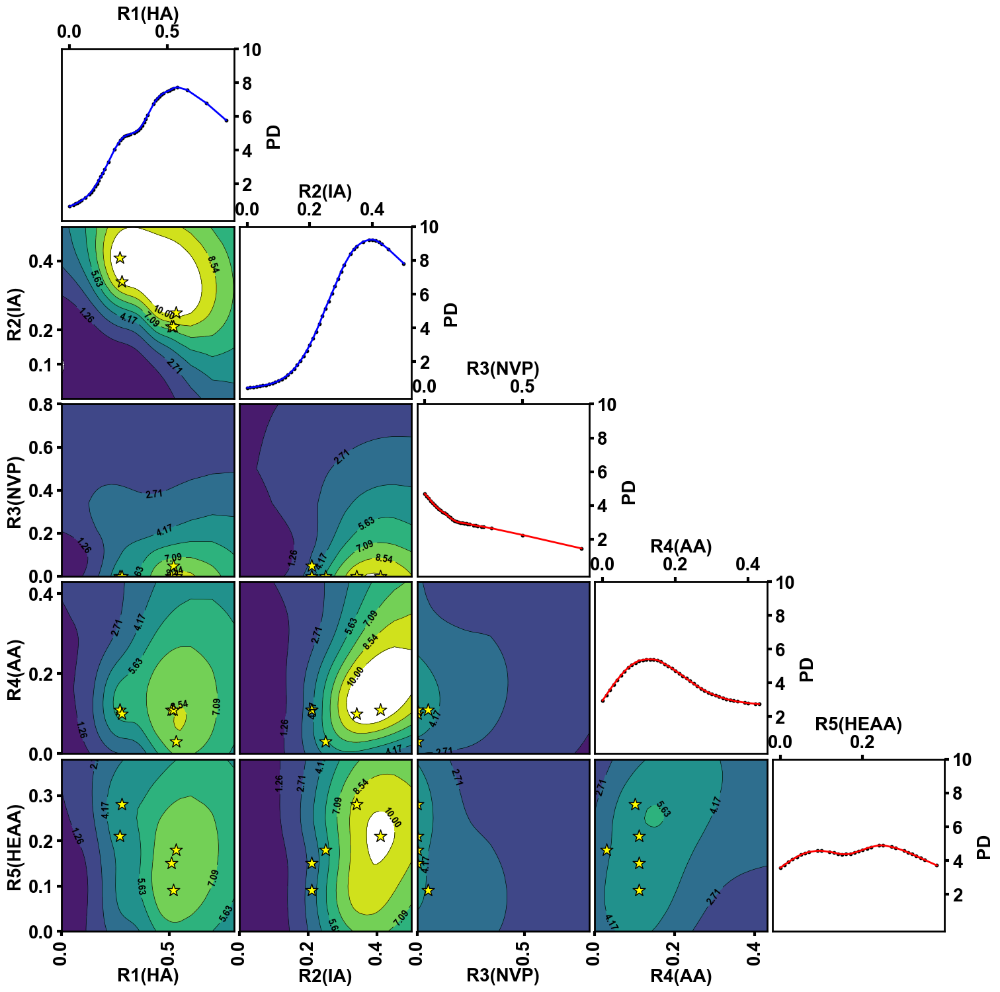

In [38]:
n_dims = 5
step = 0.055
min_z, max_z = -0.2, 10
X_ratios = df.iloc[:, 1:6]

fig, ax = plt.subplots(n_dims, n_dims,
                       figsize=(3 * n_dims, 3 * n_dims))
fig.subplots_adjust(left=0.06, right=0.95, bottom=0.06, top=0.95,
                    hspace=0.032, wspace=0.032)
Ratios = ['R1(HA)',	'R2(IA)', 'R3(NVP)',
          'R4(AA)', 'R5(HEAA)', 'R6(IBOA)']
color = ['blue' if i > 1 else 'red']
for i in range(n_dims):
    for j in range(n_dims):
        color = 'red' if i > 1 else 'blue'
        if i == j:
            ax_ = ax[i, j]
            ax_.set_yticks((2, 4, 6, 8, 10))
            pd_results = partial_dependence(gpr_toughness, X_ratios, features=[i],
                                            grid_resolution=100, percentiles=(0.05, 0.095))
            ratio = np.array(pd_results["values"])[0]
            part_dep = np.array(pd_results["average"])[0]

            ax_.plot(ratio, part_dep, color=color, markersize=20, linewidth=2)
            ax_.scatter(ratio, part_dep, color='black', s=10,)

            ax_.xaxis.set_label_position("top")
            ax_.xaxis.tick_top()
            ax_.set_xlabel('{}'.format(
                Ratios[i]), fontweight='bold', fontsize=20, labelpad=5)
            ax_.yaxis.set_label_position("right")
            ax_.yaxis.tick_right()
            ax_.set_ylabel('PD',
                           fontweight='bold', fontsize=20, fontname='Arial', )
            ax_.tick_params('y', length=0, width=0, )
            ax_.set_ylim(min_z, max_z)
            ax_.tick_params(direction='out', length=5, width=3, colors='black',
                            grid_alpha=1, labelsize='20')

        elif i > j:
            ax_ = ax[i, j]
            features = [j, i]
            pd_inter_results = partial_dependence(gpr_toughness, X_ratios,
                                                  features=features, method='brute',
                                                  kind='average', grid_resolution=100, percentiles=(0.05, 0.095))
            XX, YY = np.meshgrid(
                pd_inter_results['values'][0], pd_inter_results['values'][1])
            Z = pd_inter_results['average'][0].T
            Z_level = np.linspace(min_z, max_z, num=8)
            CS = ax_.contour(XX, YY, Z, levels=Z_level,
                             linewidths=0.5, colors="k")
            ax_.contourf(
                XX,
                YY,
                Z,
                levels=Z_level,
                vmin=Z_level[0],
                vmax=Z_level[-1],
            )
            if i == 1 and j == 0:
                ax_.set_yticks((0.1, 0.2, 0.4))
            ax_.tick_params(direction='out', length=5, width=3, colors='black',
                            grid_alpha=1, labelsize='20')

            ax_.tick_params('x', direction='out', length=5, width=3, colors='black',
                            grid_alpha=1, labelsize='20', rotation=90)
            ax_.clabel(CS, fmt="%2.2f", colors="k", fontsize=10, inline=True)
            ax_.scatter(Ratios[j], Ratios[i], data=df_pareto,
                        color='yellow', edgecolors='black',
                        s=200, marker='*')

            if j == 0:
                ax_.set_ylabel('{}'.format(Ratios[i]), fontweight='bold',
                               fontsize=20, fontname='Arial', labelpad=5)
                if i != (n_dims-1):
                    ax_.set_xticklabels([])
                    ax_.tick_params('x', length=0, width=0, )
            if i == (n_dims-1):
                ax_.set_xlabel('{}'.format(Ratios[j]), fontweight='bold',
                               fontsize=20, fontname='Arial')

            if i != (n_dims-1):
                if j != 0:
                    ax_.tick_params('both', length=0, width=0, )
                    ax_.set_xticklabels([])
                    ax_.set_yticklabels([])
            if i == (n_dims-1):
                if j != 0:
                    ax_.tick_params('y', length=0, width=0, )
                    ax_.set_yticklabels([])
        if j > i:
            ax_ = ax[i, j]
            ax_.axis("off")
plt.savefig('pd_tough', dpi=500)


/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(


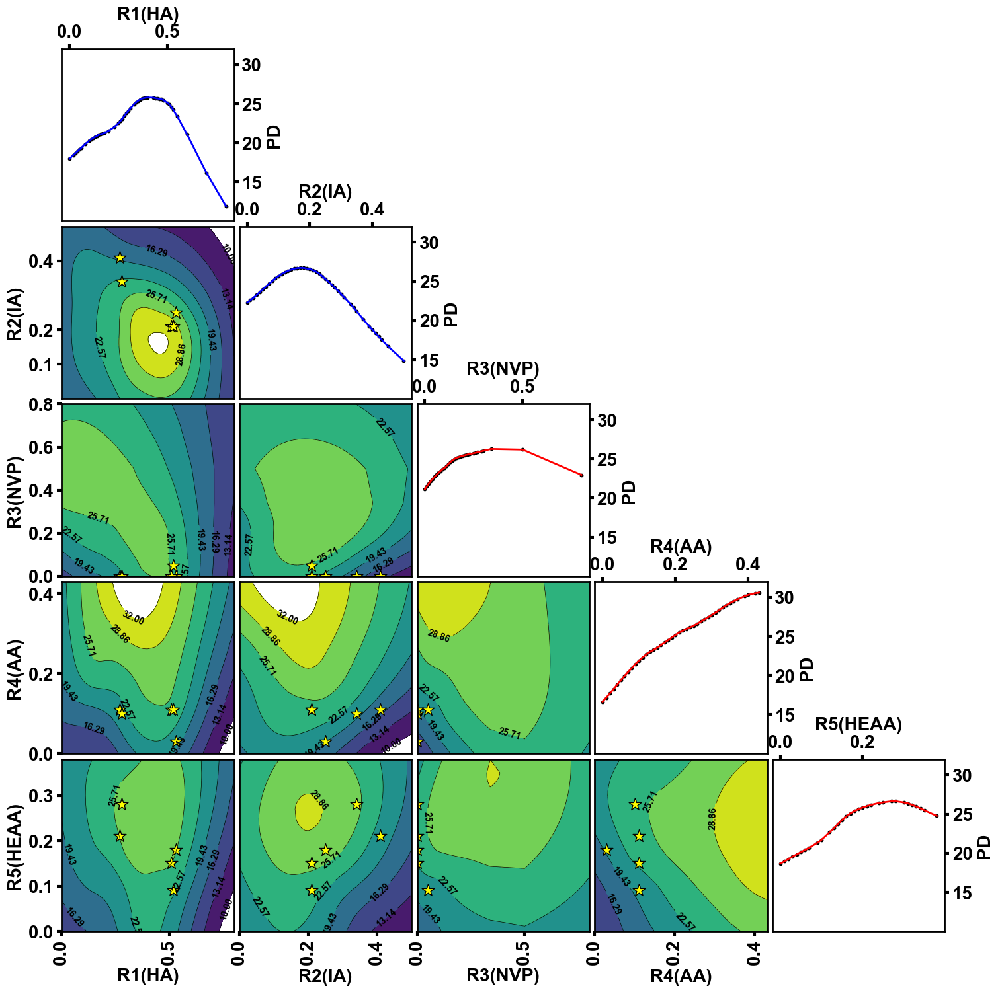

In [497]:
n_dims = 5
step = 0.055
min_z, max_z = 10, 32
X_ratios = df.iloc[:, 1:6]

fig, ax = plt.subplots(n_dims, n_dims,
                       figsize=(3 * n_dims, 3 * n_dims))
fig.subplots_adjust(left=0.06, right=0.95, bottom=0.06, top=0.95,
                    hspace=0.032, wspace=0.032)
Ratios = ['R1(HA)',	'R2(IA)', 'R3(NVP)',
          'R4(AA)', 'R5(HEAA)', 'R6(IBOA)']
color = ['blue' if i > 1 else 'red']
for i in range(n_dims):
    for j in range(n_dims):
        color = 'red' if i > 1 else 'blue'
        if i == j:
            ax_ = ax[i, j]
            ax_.set_yticks((15, 20, 25, 30))
            pd_results = partial_dependence(gpr_strength, X_ratios, features=[i],
                                            grid_resolution=100, percentiles=(0.05, 0.095))
            ratio = np.array(pd_results["values"])[0]
            part_dep = np.array(pd_results["average"])[0]

            ax_.plot(ratio, part_dep, color=color, markersize=20, linewidth=2)
            ax_.scatter(ratio, part_dep, color='black', s=10,)

            ax_.xaxis.set_label_position("top")
            ax_.xaxis.tick_top()
            ax_.set_xlabel('{}'.format(
                Ratios[i]), fontweight='bold', fontsize=20, labelpad=5)
            ax_.yaxis.set_label_position("right")
            ax_.yaxis.tick_right()
            ax_.set_ylabel('PD',
                           fontweight='bold', fontsize=20, fontname='Arial', )
            ax_.tick_params('y', length=0, width=0, )
            ax_.set_ylim(min_z, max_z)
            ax_.tick_params(direction='out', length=5, width=3, colors='black',
                            grid_alpha=1, labelsize='20')

        elif i > j:
            ax_ = ax[i, j]
            features = [j, i]
            
            pd_inter_results = partial_dependence(gpr_strength, X_ratios,
                                                  features=features, method='brute',
                                                  kind='average', grid_resolution=100, percentiles=(0.05, 0.095))
                                         
            XX, YY = np.meshgrid(
                pd_inter_results['values'][0], pd_inter_results['values'][1])
            Z = pd_inter_results['average'][0].T
            Z_level = np.linspace(min_z, max_z, num=8)
            CS = ax_.contour(XX, YY, Z, levels=Z_level,
                             linewidths=0.5, colors="k")
            ax_.contourf(
                XX,
                YY,
                Z,
                levels=Z_level,
                vmin=Z_level[0],
                vmax=Z_level[-1],
            )
            if i == 1 and j == 0:
                ax_.set_yticks((0.1, 0.2, 0.4))
            ax_.tick_params(direction='out', length=5, width=3, colors='black',
                            grid_alpha=1, labelsize='20')

            ax_.tick_params('x', direction='out', length=5, width=3, colors='black',
                            grid_alpha=1, labelsize='20', rotation=90)
            ax_.clabel(CS, fmt="%2.2f", colors="k", fontsize=10, inline=True)
            ax_.scatter(Ratios[j], Ratios[i], data=df_pareto,
                        color='yellow', edgecolors='black',
                        s=200, marker='*')

            if j == 0:
                ax_.set_ylabel('{}'.format(Ratios[i]), fontweight='bold',
                               fontsize=20, fontname='Arial', labelpad=5)
                if i != (n_dims-1):
                    ax_.set_xticklabels([])
                    ax_.tick_params('x', length=0, width=0, )
            if i == (n_dims-1):
                ax_.set_xlabel('{}'.format(Ratios[j]), fontweight='bold',
                               fontsize=20, fontname='Arial')

            if i != (n_dims-1):
                if j != 0:
                    ax_.tick_params('both', length=0, width=0, )
                    ax_.set_xticklabels([])
                    ax_.set_yticklabels([])
            if i == (n_dims-1):
                if j != 0:
                    ax_.tick_params('y', length=0, width=0, )
                    ax_.set_yticklabels([])
        if j > i:
            ax_ = ax[i, j]
            ax_.axis("off")
plt.savefig('pd_str', dpi=500)


In [498]:
df_pareto

,sample,R1(HA),R2(IA),R3(NVP),R4(AA),R5(HEAA),R6(IBOA),Printability,Tensile_Strength(MPa),Tensile_Strain_percentage,...,sum_softmon,sum_hardmon,sum,tsne1,tsne2,pca1,pca2,initial,soft,hard
14,58,0.27,0.41,0.00,0.11,0.21,0.00,1.0,15.10,NaN,...,NaN,NaN,NaN,-0.369637,15.596103,0.068096,-0.216163,Eval.,0.68,0.32
16,60,0.28,0.34,0.00,0.10,0.28,0.00,1.0,31.22,NaN,...,NaN,NaN,NaN,1.010743,18.333263,0.049158,-0.151312,Eval.,0.62,0.38
36,80,0.53,0.25,0.00,0.03,0.18,0.01,1.0,17.82,NaN,...,NaN,NaN,NaN,20.172974,0.391474,0.296809,-0.001325,Eval.,0.78,0.21
37,81,0.51,0.21,0.00,0.11,0.15,0.02,1.0,49.99,NaN,...,NaN,NaN,NaN,17.668612,-0.979369,0.259637,0.032371,Eval.,0.72,0.26
67,113,0.52,0.21,0.05,0.11,0.09,0.02,1.0,32.03,NaN,...,NaN,NaN,NaN,16.302450,-3.518289,0.270360,0.052597,Eval.,0.73,0.25


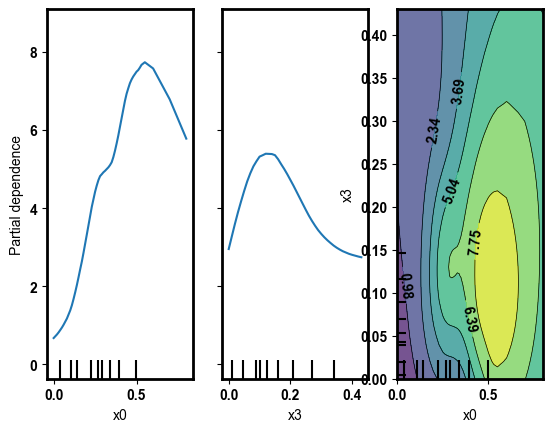

In [121]:
Ratios = ['R1(HA)',	'R2(IA)',	'R3(NVP)',	'R4(AA)',
          'R5(HEAA)',	'R6(IBOA)', 'soft', 'hard']
X_ratios = df.iloc[:, 1:6]
features = [0, 3, (0, 3)]
#plt.hist(X_ratios.iloc[:, 4])
PartialDependenceDisplay.from_estimator(gpr_toughness, X, features,)

/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(


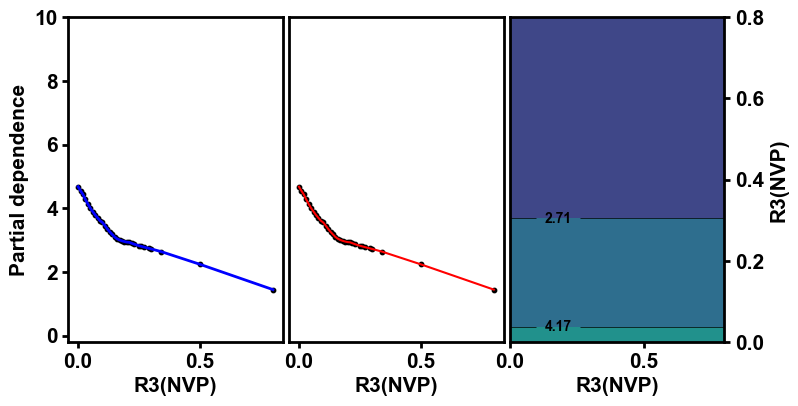

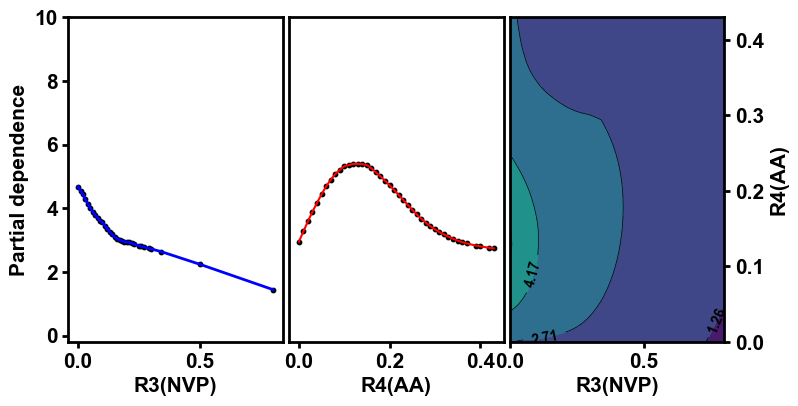

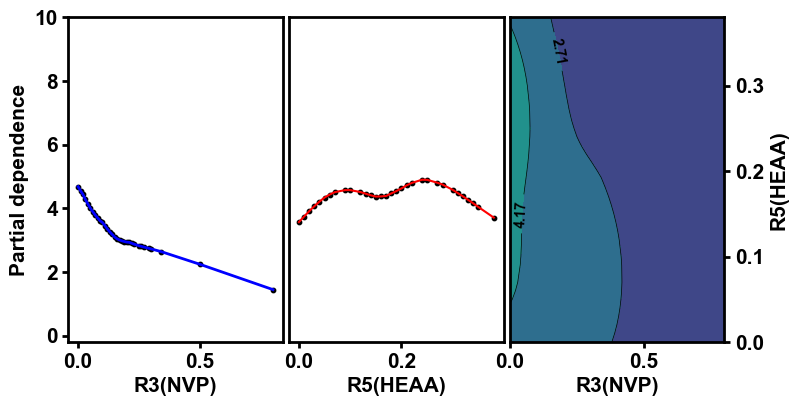

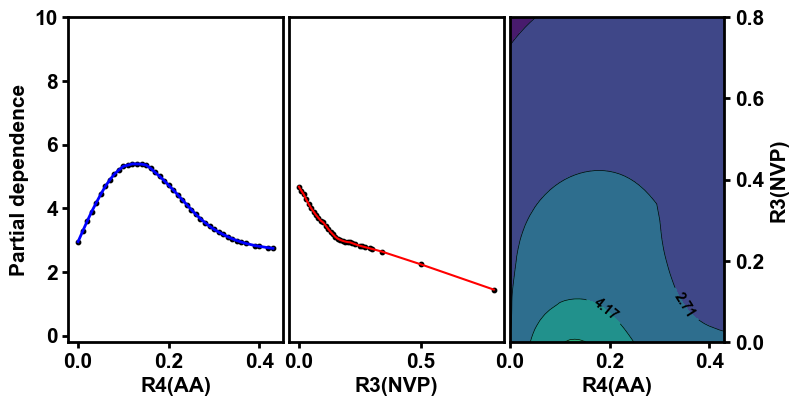

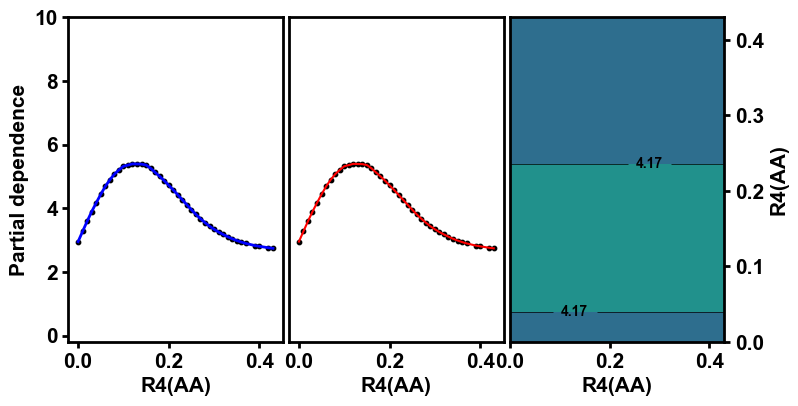

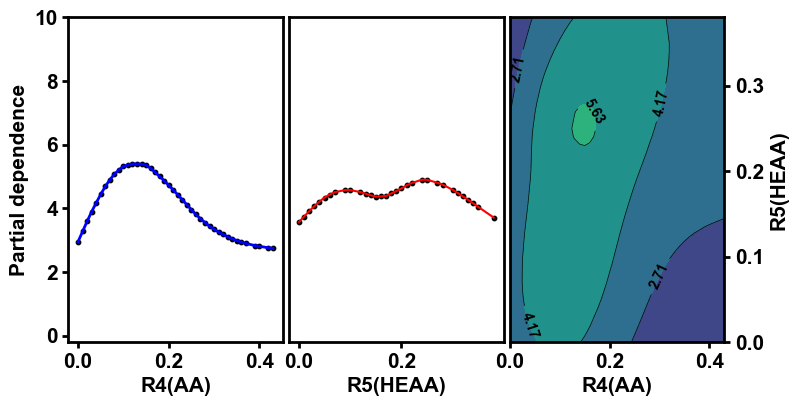

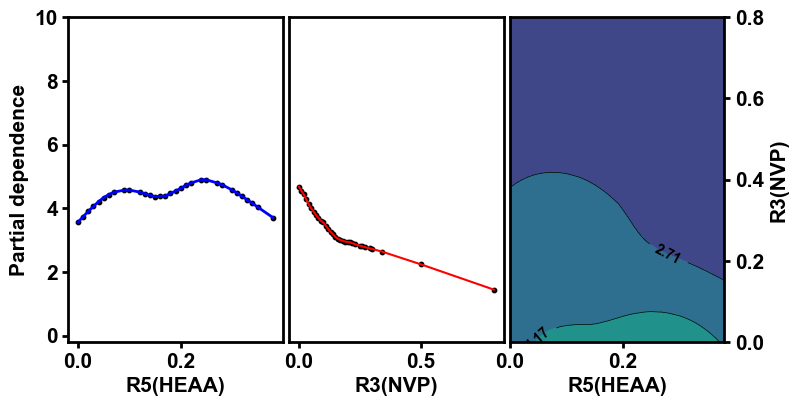

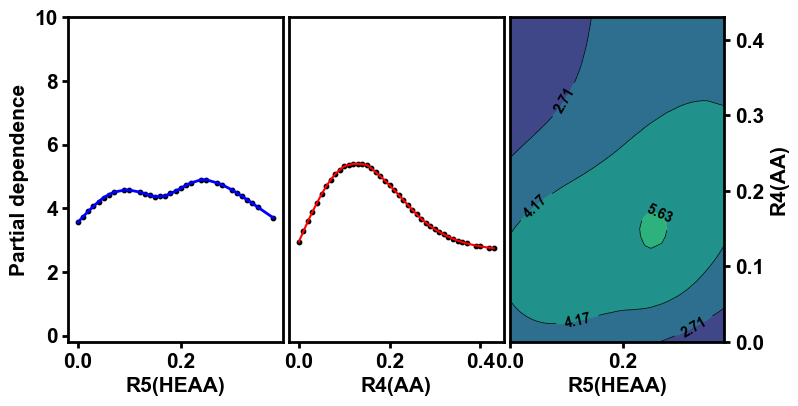

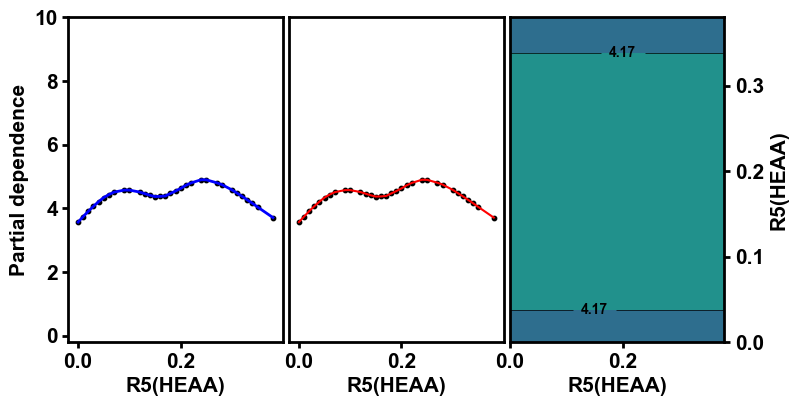

In [445]:
for soft, hard in itertools.product(range(2, 5), range(2, 5)):
    fig, ax = plt.subplots(1, 3, figsize=(8, 4), )  # constrained_layout=True)

    min_z, max_z = -0.2, 10
    # R1
    ratio_count = soft
    pd_results = partial_dependence(gpr_toughness, X_ratios, features=[ratio_count],
                                    grid_resolution=100, percentiles=(0.05, 0.095))
    ratio = np.array(pd_results["values"])[0]
    part_dep = np.array(pd_results["average"])[0]

    ax_ = ax[0]
    ax_.plot(ratio, part_dep, color='blue', markersize=20, linewidth=2)
    ax_.scatter(ratio, part_dep, color='black', s=10,)
    ax_.tick_params(direction='out', length=4, width=2, colors='black',
                    grid_alpha=1, labelsize='15')
    ax_.set_xlabel('{}'.format(Ratios[ratio_count]), fontweight='bold',
                   fontsize=15, fontname='Arial')
    ax_.set_ylabel('Partial dependence', fontsize=15,
                   fontname='Arial', fontweight='bold',)
    ax_.set_ylim(min_z, max_z)
    ratio1 = Ratios[ratio_count]
    # R4
    ratio_count = hard
    pd_results = partial_dependence(gpr_toughness, X_ratios, features=[ratio_count],
                                    grid_resolution=100, percentiles=(0, 1))
    ratio = np.array(pd_results["values"])[0]
    part_dep = np.array(pd_results["average"])[0]

    ax_ = ax[1]
    ax_.plot(ratio, part_dep, color='red', markersize=15)
    ax_.scatter(ratio, part_dep, color='black', s=10,)
    ax_.set_yticklabels([])
    ax_.tick_params('x', direction='out', length=4, width=2, colors='black',
                    grid_alpha=1, labelsize='15')
    ax_.tick_params('y', direction='out', length=0, width=0, colors='black',
                    grid_alpha=1, labelsize='15')

    ax_.set_xlabel('{}'.format(Ratios[ratio_count]), fontweight='bold',
                   fontsize=15, fontname='Arial')
    ax_.set_ylabel('', fontsize=15,
                   fontname='Arial', fontweight='bold',)
    ax_.set_ylim(min_z, max_z)
    ratio2 = Ratios[ratio_count]

    # Interaction of R1 and R4
    ax_ = ax[2]
    ratio_count = 0
    X_ratios = df.iloc[:, 1: 6]
    features = [soft, hard]
    pd_inter_results = partial_dependence(gpr_toughness, X_ratios, features=features, method='brute',
                                          kind='average',
                                          grid_resolution=100, percentiles=(0.05, 0.095))

    XX, YY = np.meshgrid(
        pd_inter_results['values'][0], pd_inter_results['values'][1])
    Z = pd_inter_results['average'][0].T
    Z_level = np.linspace(min_z, max_z, num=8)
    CS = ax_.contour(XX, YY, Z, levels=Z_level, linewidths=0.5, colors="k")

    ax_.contourf(
        XX,
        YY,
        Z,
        levels=Z_level,
        vmin=Z_level[0],
        vmax=Z_level[-1],
    )
    ax_.yaxis.set_label_position("right")
    ax_.yaxis.tick_right()

    ax_.tick_params(direction='out', length=4, width=2, colors='black',
                    grid_alpha=1, labelsize='15')
    ax_.set_xlabel('{}'.format(Ratios[soft]), fontweight='bold',
                   fontsize=15, fontname='Arial')
    ax_.set_ylabel('{}'.format(Ratios[hard]), fontweight='bold',
                   fontsize=15, fontname='Arial')
    ax_.clabel(CS, fmt="%2.2f", colors="k", fontsize=10, inline=True)
    # save the figure
    fig.subplots_adjust(left=0.08, right=0.9, bottom=0.138, top=0.95,
                        hspace=0.02, wspace=0.03)
    # plt.tight_layout()
    plt.savefig('pd_tough_{}_{}'.format(ratio1, ratio2), dpi=500)


In [274]:
def generate_all_sets_with_sum_between_zero_and_one(max_range, shift):
    valid_sets = []
    # Generate all possible combinations
    for combination in itertools.product(range(0, max_range+1), repeat=5):
        # Scale the numbers to be between 0 and 1
        numbers = [round(x / (max_range+shift), 3) for x in combination]
        total_sum = sum(numbers)

        if 0 <= total_sum <= 1.0000:
            valid_sets.append(numbers)
    return valid_sets

"""
X_simulated0 = np.array(
    generate_all_sets_with_sum_between_zero_and_one(max_range=10, shift=30))
"""
X_simulated1 = np.array(
    generate_all_sets_with_sum_between_zero_and_one(max_range=26, shift=0))

#X_simulated = list(np.concatenate((X_simulated0, X_simulated1), axis=0))
X_simulated = X_simulated1.copy()
dimension = (int(np.sqrt(len(X_simulated)))+1)**2


In [275]:
#X_simulated_orig = np.concatenate((X_simulated0, X_simulated1), axis=0)
X_simulated_orig = X_simulated.copy()

In [175]:
with open('X_simulated_5mon2.npy', 'wb') as f:
  np.save(f, X_simulated_orig)
with open('X_simulated_5mon2.npy', 'rb' ) as f:
    X_simulated_orig = np.load(f)

In [326]:
rng = np.random.default_rng()
random_x = rng.integers(low=0, high=100, size=5)
random_x/100


array([0.8 , 0.41, 0.92, 0.54, 0.53])

In [50]:
def generate_random_integers(sum_value, num_integers, min_value, max_value, ):
    count = 0
    rand_integers = np.random.randint(
        min_value, max_value + 1, size=num_integers,)
    while np.sum(rand_integers) != sum_value:
        rand_integers = np.random.randint(
            min_value, max_value + 1, size=num_integers)
        count +=1

    return rand_integers


sum_value = 100
num_integers = 6
min_value = 0
max_value = 100
xsim_random = []
for i in range(0, 100000):
    random_integers = generate_random_integers(
        sum_value, num_integers, min_value, max_value,)
    xsim_random.append(random_integers[0: 5]/100)


In [432]:
def generate_random_integers(sum_value, num_integers, min_value, max_value):
    rand_integers = np.random.randint(min_value, max_value + 1, size=num_integers - 1)
    rand_integers = np.append(rand_integers, sum_value - np.sum(rand_integers))
    np.random.shuffle(rand_integers)
    return rand_integers

sum_value = 100
num_integers = 6
min_value = 0
max_value = 100

random_integers = generate_random_integers(sum_value, num_integers, min_value, max_value)
print("Random Integers:", random_integers)
print("Sum:", np.sum(random_integers))

Random Integers: [  89  100   23   34   35 -181]
Sum: 100


In [51]:
X_simulated_orig = xsim_random.copy()

In [52]:
dimension = (int(np.sqrt(len(X_simulated_orig)))+1)**2
X_simulated_orig = list(X_simulated_orig)
if len(X_simulated_orig) < dimension:
    for i in range(0, dimension-len(X_simulated_orig)):
        X_simulated_orig.append(X_simulated_orig[0])

np.random.shuffle (X_simulated_orig)
X_simulated = X_simulated_orig.copy()
len(X_simulated)
X_sim = np.array(X_simulated)

strength_sim0 = gpr_strength.predict(X_sim)
print(strength_sim0.shape)
Z = strength_sim0.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))
#x = np.multiply(X_sim[:, 0].ravel() + X_sim[:, 1].ravel() , X_sim[:, 0].ravel() )
pca = PCA(n_components=2)
X_sim_pca = pca.fit_transform(X_sim)

x = (X_sim[:, 0].ravel() + X_sim[:, 1].ravel() )#* (1+X_sim[:, 0].ravel() )
y = (X_sim[:, 2].ravel()  + X_sim[:, 3].ravel() + X_sim[:, 4].ravel())#*(1+X_sim[:, 4].ravel())
#x = X_sim_pca[:, 0]
#y = X_sim_pca[:, 1]
#x = X_sim[:, 0].ravel()
#y = X_sim[:, 3].ravel() 
     
X = x.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))
Y = y.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))


(100489,)


In [42]:
# run it if changing x, y definition
#x = (X_sim[:, 0].ravel() + X_sim[:, 1].ravel())  # * (1+X_sim[:, 0].ravel() )
#y = X_sim[:, 2].ravel() + X_sim[:, 3].ravel() + X_sim[:, 4].ravel()
#x = X_sim_pca[:, 0]
#y = X_sim_pca[:, 1]

#X = x.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))
#Y = y.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))


In [53]:
print(np.nanmax(X))
print(np.nanmin(X))
print(np.nanmax(Y))
print(np.nanmin(Y))

print(np.nanmax(Z))
print(np.nanmin(Z))


0.98
0.0
1.0
0.0
42.627799103112814
-2.7335942938991273


In [54]:
# provide the evalu points with grouping objectives
x_eval_hard = x_eval[:, 2].ravel() + x_eval[:, 3].ravel() + \
    x_eval[:, 4].ravel()
df_eval_ = pd.DataFrame({})
df_eval_['soft'] = x_eval_soft
df_eval_['hard'] = x_eval_hard
df_eval_['true_strength'] = Y_eval[:, 0]
# Define the number of bins
num_bins = 100
# Calculate bin edges
bin_edges0 = np.linspace(np.min(df_eval_['true_strength']), np.max(
    df_eval_['true_strength']), num_bins + 1)
bin_edges = bin_edges0.copy()
bin_edges[0] = bin_edges0[0] - 0.01
bin_edges[-1] = bin_edges0[-1] + 0.01
bin_edges = bin_edges + 0.001

# Bin the continuous values into groups
grouped_values = pd.cut(
    df_eval_['true_strength'], bins=bin_edges, labels=range(1, num_bins+1))
df_eval_['strength_group'] = grouped_values


In [55]:
df_init['sum_hard5'] = df_init['sum_hardmon'] - df_init['R6(IBOA)']

/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


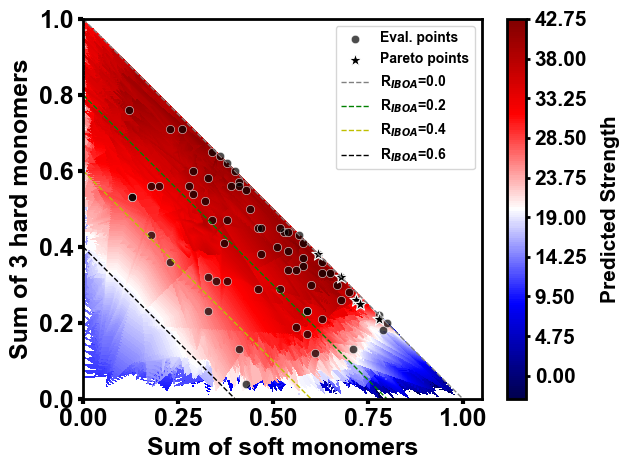

In [57]:
# Create the contour plot
fig, ax = plt.subplots(1, 1, )
cs = ax.contourf(X, Y, Z, cmap='seismic',
                 levels=200)  # levels=100)

cbar = fig.colorbar(cs, ax=ax, label='Predicted Strength')
# sns.scatterplot('soft', 'hard', legend = False, hue='Tensile_Strength(MPa)', palette="viridis", edgecolor='black',
#                data=df_eval,)
sns.scatterplot('soft', 'hard', label='Eval. points',  color='black', alpha=0.7,
                # legend = True, #hue='true_strength', palette="viridis", edgecolor='black',
                data=df_eval_,)
""" 
sns.scatterplot('sum_softmon', 'sum_hard5', label='Initial points',  color='red',alpha=0.4,
                # legend = True, #hue='true_strength', palette="viridis", edgecolor='black',
                data=df_init,)
"""


plt.legend('Eval. points')
sns.scatterplot('soft', 'hard', label='Pareto points',  color='black',  alpha=1, s=100, marker='*',
                data=df_pareto,)
plt.legend('Pareto points')
ratios = np.arange(0, 0.8, 0.2)
colors = ['grey', 'green', 'y', 'k']
for color, ratio in zip(colors, ratios):
    plt.plot([0, 1-ratio], [1-ratio, 0],  '--',
             color=color, linewidth=1, label=r'R$_{IBOA}$='+'{}'.format(round(ratio, 2)))
    plt.legend()

ax.tick_params(direction='out', length=3.5, width=3, colors='black',
               grid_alpha=1, labelsize='18')
# Add labels and title
plt.xlabel('Sum of soft monomers', fontweight='bold', fontsize=18)
plt.ylabel('Sum of 3 hard monomers', fontweight='bold', fontsize=18)
#plt.title('Contour Plot of strength prediction')
#plt.xlim(0.04, 1)
#plt.ylim(0.04, 1)

cbar.ax.set_ylabel('Predicted Strength', fontsize=15, fontname='Arial',
                   fontweight='bold', labelpad=10)
cbar.ax.tick_params(axis='both', which='major',
                    labelsize=15,  width=2, length=3)
# Show the plot
plt.tight_layout()
plt.savefig('contourplot_soft_hard_str.png', dpi=500)


In [118]:
with open('X_simulated_5mon.npy', 'rb' ) as f:
    X_simulated_orig = np.load(f)

In [262]:
dimension = (int(np.sqrt(len(X_simulated_orig)))+1)**2
X_simulated_orig = list(X_simulated_orig)
if len(X_simulated_orig) < dimension:
    for i in range(0, dimension-len(X_simulated_orig)):
        X_simulated_orig.append(X_simulated_orig[0])

X_simulated = X_simulated_orig.copy()
len(X_simulated)
X_sim = np.array(X_simulated)

toughness_sim0 = gpr_toughness.predict(X_sim)
print(toughness_sim0.shape)
Z = toughness_sim0.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))
#x = np.multiply(X_sim[:, 0].ravel() + X_sim[:, 1].ravel() , X_sim[:, 0].ravel() )
pca = PCA(n_components=2)
X_sim_pca = pca.fit_transform(X_sim)

x = (X_sim[:, 1].ravel() )  # * (1+X_sim[:, 0].ravel() )
y = (X_sim[:, 4].ravel())  # *(1+X_sim[:, 4].ravel())

X = x.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))
Y = y.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))


(171396,)


In [263]:
print(np.nanmax(X))
print(np.nanmin(X))
print(np.nanmax(Y))
print(np.nanmin(Y))

print(np.nanmax(Z))
print(np.nanmin(Z))

1.0
0.0
1.0
0.0
24.486431381071064
-1.207873341420548


In [255]:
df_pareto.iloc[:, 1:6]

,R1(HA),R2(IA),R3(NVP),R4(AA),R5(HEAA)
14,0.27,0.41,0.00,0.11,0.21
16,0.28,0.34,0.00,0.10,0.28
36,0.53,0.25,0.00,0.03,0.18
37,0.51,0.21,0.00,0.11,0.15
67,0.52,0.21,0.05,0.11,0.09


In [256]:
gpr_toughness.predict (df_pareto.iloc[:, 1:6])

/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but GaussianProcessRegressor was fitted without feature names
  warnings.warn(


array([25.76, 22.56, 25.02,  2.75,  7.58])

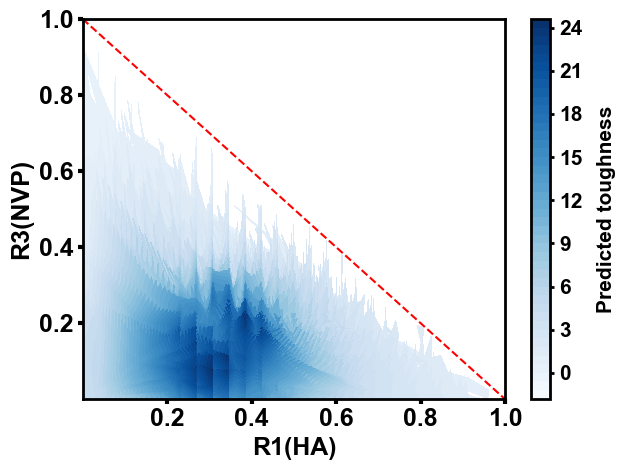

In [264]:
# Create the contour plot
fig, ax = plt.subplots(1, 1, )
cs = ax.contourf(X, Y, Z, cmap='Blues',
                 levels=50)  # levels=100)

cbar = fig.colorbar(cs, ax=ax, label='Predicted Toughness')
# sns.scatterplot('soft', 'hard', legend = False, hue='Tensile_toughness(MPa)', palette="viridis", edgecolor='black',
#                data=df_eval,)
""" 
sns.scatterplot('sum_softmon', 'sum_hard5', label='Initial points',  color='red',alpha=0.4,
                # legend = True, #hue='true_toughness', palette="viridis", edgecolor='black',
                data=df_init,)
"""

ratios = np.arange(0, 0.8, 0.2)
colors = ['grey', 'green', 'y', 'k']

plt.plot([0, 1], [1, 0], '--r')
ax.tick_params(direction='out', length=3.5, width=3, colors='black',
               grid_alpha=1, labelsize='18')
# Add labels and title
plt.xlabel('R1(HA)', fontweight='bold', fontsize=18)
plt.ylabel('R3(NVP)', fontweight='bold', fontsize=18)
#plt.title('Contour Plot of toughness prediction')
plt.xlim(0.001, 1)
plt.ylim(0.001, 1)

cbar.ax.set_ylabel('Predicted toughness', fontsize=15, fontname='Arial',
                   fontweight='bold', labelpad=10)
cbar.ax.tick_params(axis='both', which='major',
                    labelsize=15,  width=2, length=3)
# Show the plot
plt.tight_layout()
plt.savefig('contourplot_soft1_hard1_tough.png', dpi=500)


In [47]:
df['Toughness(MJ/m3)']

,sample,R1(HA),R2(IA),R3(NVP),R4(AA),R5(HEAA),R6(IBOA),Printability,Tensile_Strength(MPa),Tensile_Strain_percentage,...,Youngs_Modulus(MPa),Tg,sum_softmon,sum_hardmon,sum,tsne1,tsne2,pca1,pca2,initial
0,1,0.15,0.20,0.02,0.21,0.18,0.24,NaN,45.51,7.10,...,1300.199,56.6,0.35,0.65,1.0,0.510834,-5.260442,-0.093719,-0.054304,Initial
1,2,0.25,0.31,0.11,0.02,0.16,0.15,NaN,17.95,96.87,...,503.150,14.2,0.56,0.44,1.0,-17.501356,2.524794,0.041478,-0.100606,Initial
2,3,0.06,0.17,0.27,0.11,0.27,0.12,NaN,32.74,3.79,...,924.700,54.8,0.23,0.77,1.0,-3.057491,-29.406973,-0.244976,0.028596,Initial
3,4,0.00,0.10,0.30,0.20,0.20,0.20,NaN,27.81,3.79,...,1404.640,56.7,0.10,0.90,1.0,-8.452329,-33.603291,-0.321841,0.087575,Initial
4,5,0.35,0.35,0.00,0.00,0.10,0.20,NaN,1.20,400.28,...,0.608,13.1,0.70,0.30,1.0,-18.640648,15.556582,0.187369,-0.146428,Initial
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,111,0.11,0.02,0.00,0.34,0.19,0.34,1.0,30.46,NaN,...,NaN,65.8,NaN,NaN,NaN,-16.657022,-9.509528,-0.189302,0.093145,Eval.
66,112,0.43,0.22,0.15,0.13,0.05,0.02,1.0,44.84,NaN,...,NaN,39.3,NaN,NaN,NaN,10.756840,-4.484246,0.171217,0.052873,Eval.
67,113,0.52,0.21,0.05,0.11,0.09,0.02,1.0,32.03,NaN,...,NaN,35.7,NaN,NaN,NaN,16.302450,-3.518289,0.270360,0.052597,Eval.
68,114,0.13,0.19,0.03,0.43,0.06,0.16,1.0,22.79,NaN,...,NaN,56.4,NaN,NaN,NaN,-13.487068,-2.462492,-0.142361,-0.036144,Eval.


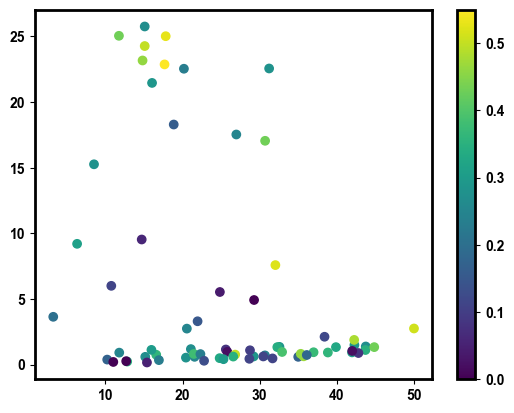

In [65]:
# plot two objectives with Ratios as colors
plt.scatter(x='Tensile_Strength(MPa)',
                y='Toughness(MJ/m3)', c='R1(HA)', data=df_eval)
plt.colorbar()

# Add labels and title
plt.xlabel('Sum of soft monomers', fontweight='bold', fontsize=15)
plt.ylabel('Sum of 3 hard monomers', fontweight='bold', fontsize=15)
plt.title('Contour Plot of strength prediction')
plt.xlim(0.001, 1)
plt.ylim(0.001, 1)
#plt.legend([])
# Show the plot
plt.savefig('contourplot_soft_hard.png', dpi=500)

/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/seaborn/relational.py:608: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scout = ax.scatter(scout_x, scout_y, **kws)
/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/seaborn/relational.py:658: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  points = ax.scatter(*args, **kws)


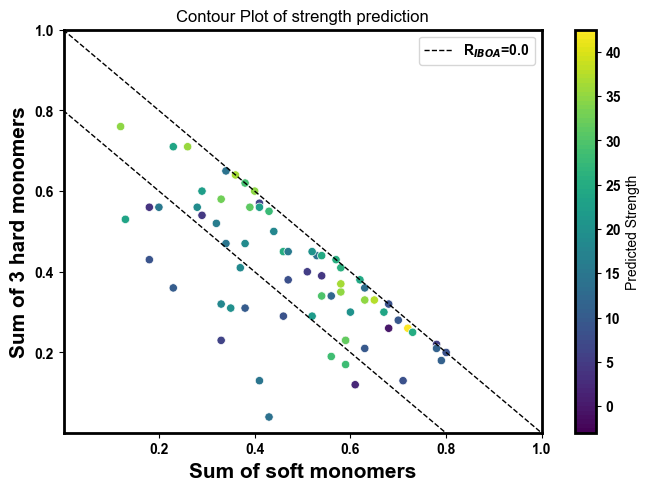

In [ ]:
# Create the contour plot
fig, ax = plt.subplots(1, 1, layout="constrained")
fig.colorbar(cs, ax=ax, label='Predicted Strength')
sns.scatterplot('soft_monomers', 'hard_monomers', legend = False, # hue='strength_group', palette="viridis",
                data=df_eval_, cmap='viridis', hue='true_strength', palette='viridis', ax=ax)

plt.legend([])
ratios = np.arange(0, 0.8, 0.2)
colors = ['b', 'r', 'y', 'k']
plt_mains = []
#for color, ratio in zip(colors, ratios):
plt_main1 = plt.plot([0, 1-ratios[1]], [1-ratios[1], 0],  '--',
                    color=color, linewidth=1, label=r'R$_{IBOA}$='+'{}'.format(round(ratios[1], 2)))
#plt.legend([''])
#plt.legend(handles=plt_main)
plt_main2 = plt.plot([0, 1-ratios[0]], [1-ratios[0], 0],  '--',
                    color=color, linewidth=1, label=r'R$_{IBOA}$='+'{}'.format(round(ratios[0], 2)))
#plt.legend([''])

    
    # legend.get_title().set_fontsize('15')


# Add labels and title
plt.xlabel('Sum of soft monomers', fontweight='bold', fontsize=15)
plt.ylabel('Sum of 3 hard monomers', fontweight='bold', fontsize=15)
plt.title('Contour Plot of strength prediction')
plt.xlim(0.001, 1)
plt.ylim(0.001, 1)
#plt.legend([])
# Show the plot
plt.savefig('contourplot_soft_hard.png', dpi=500)


/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


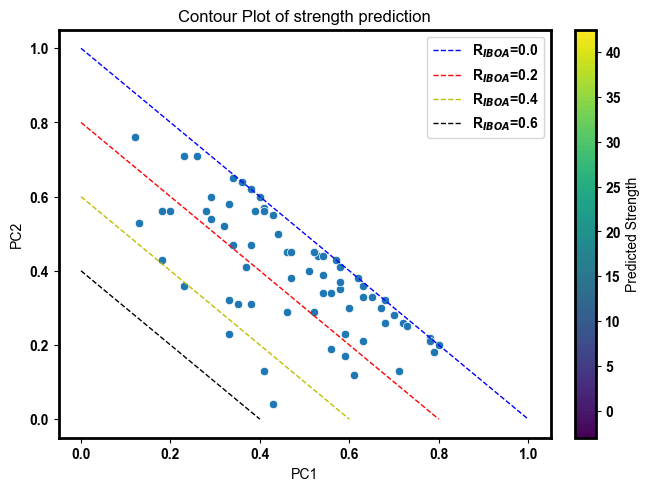

In [90]:
# Create the contour plot
fig, ax = plt.subplots(1, 1, layout="constrained")
fig.colorbar(cs, ax=ax, label='Predicted Strength')
sns.scatterplot('soft_monomers', 'hard_monomers',  # hue='strength_group', palette="viridis",
                data=df_eval_,)  # cmap='viridis', hue='true_strength',


ratios = np.arange(0, 0.8, 0.2)
colors = ['b', 'r', 'y', 'k']
for color, ratio in zip(colors, ratios):
    plt.plot([0, 1-ratio], [1-ratio, 0],  '--',
             color=color, linewidth=1, label=r'R$_{IBOA}$='+'{}'.format(round(ratio, 2)))
    plt.legend()

# Add labels and title
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Contour Plot of strength prediction')
#plt.xlim(0.02, 1)
#plt.ylim(0.02, 1)
# Show the plot
plt.savefig('contourplot_soft_hard.png', dpi=500)

/home/kianoosh/anaconda3/envs/autooed/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


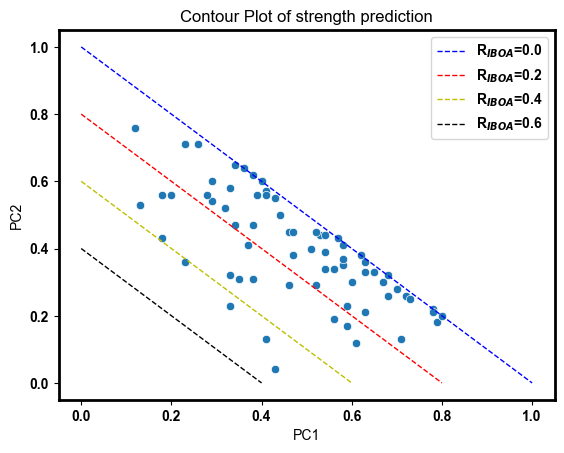

In [89]:
sns.scatterplot('soft_monomers', 'hard_monomers',  # hue='strength_group', palette="viridis",
                data=df_eval_,)  # cmap='viridis', hue='true_strength',


ratios = np.arange(0, 0.8, 0.2)
colors = ['b', 'r', 'y', 'k']
for color, ratio in zip(colors, ratios):
    plt.plot([0, 1-ratio], [1-ratio, 0],  '--',
             color=color, linewidth=1, label=r'R$_{IBOA}$='+'{}'.format(round(ratio, 2)))
    plt.legend()

# Add labels and title
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Contour Plot of strength prediction')
#plt.xlim(0.02, 1)
#plt.ylim(0.02, 1)
# Show the plot
plt.savefig('contourplot_soft_hard.png', dpi=500)

In [550]:
# sum(Soft) and sum(Hard) monomers as x and y axies
# Define the function Z = f(x1, x2, x3, x4, x5)
def custom_function(x):
    x = np.array(x)
    z = np.zeros(shape=(x.shape[1], x.shape[2]))
    row_count = 0
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            z[i, j] = gpr_strength.predict(x[:, i, j].reshape(1, -1))
    return z


# Define the ranges of x and y values
dim = 10000
x_range = np.linspace(0.6, 1., dim)
x_range2 = np.linspace(0., 1., dim)
x_range3 = np.linspace(0., 1, dim)
x_range4 = np.linspace(.6, 1., dim)

# Create a grid of x and y values
#X, Y = np.meshgrid(x_range, y_range)
x_range_tot = np.concatenate((x_range, x_range2, x_range3, x_range4))
X = x_range_tot.reshape(int(np.sqrt(4*dim)), int(np.sqrt(4*dim)))
y_range = np.linspace(0, 1., dim)
y_range2 = np.linspace(0.6, 1., dim)
y_range3 = np.linspace(0.6, 1, dim)
y_range4 = np.linspace(0., 1., dim)

# Create a grid of y and y values
#y, Y = np.meshgrid(y_range, y_range)
y_range_tot = np.concatenate((y_range, y_range2, y_range3, y_range4))
Y = y_range_tot.reshape(int(np.sqrt(4*dim)), int(np.sqrt(4*dim)))

# Calculate the corresponding x2 values based on the constraint sigma(x1 + x2) = X
x2_values = X-X**2

# Calculate the corresponding x5 values based on the constraint sigma(x3 + x4 + x5) = Y
x5_values = Y-Y**3.1

# Calculate the remaining x1, x3, and x4 values
x1_values = X - x2_values
x3_values = (Y - x5_values) / 2
x4_values = (Y - x5_values) / 2


# Calculate the function values Z = f(x1, x2, x3, x4, x5)
#Z = custom_function([x1_values, x2_values, x3_values, x4_values, x5_values])
Z = np.where(X + Y <= 1, custom_function([x1_values,
             x2_values, x3_values, x4_values, x5_values]), np.nan)


In [584]:
sum(sum(Z>0))


1797

In [572]:
Z.shape

(50, 50)

In [571]:
print(np.nanmax(x5_values))
print(np.nanmin(x2_values))

0.24989587671803415
0.0


TypeError: Shapes of x (5, 5) and z (50, 50) do not match

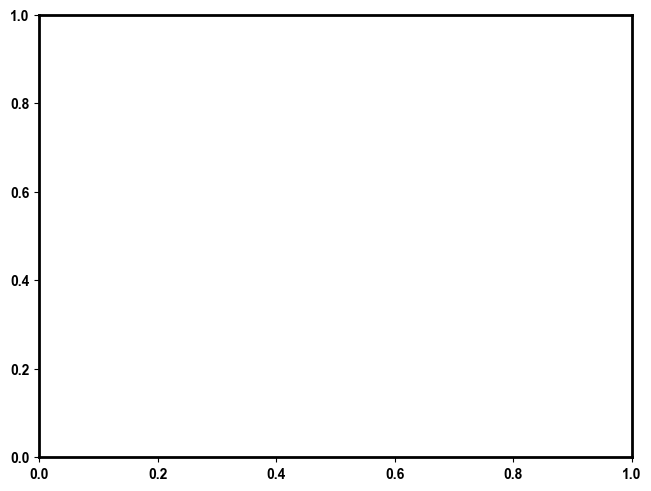

In [583]:
# Create the contour plot
fig, ax = plt.subplots(1, 1, layout="constrained")
cs = ax.contourf(X, Y, Z, cmap='viridis',
                 levels=20)  # levels=100)
fig.colorbar(cs, ax=ax, label='Predicted Strength')
sns.scatterplot('soft_monomers', 'hard_monomers',  # hue='strength_group', palette="viridis",
                data=df_eval_,)  # cmap='viridis', hue='true_strength',

ratios = np.arange(0, 0.8, 0.2)
colors = ['b', 'r', 'y', 'k']
for color, ratio in zip(colors, ratios):
    plt.plot([0, 1-ratio], [1-ratio, 0],  '--',
             color=color, linewidth=1, label=r'R$_{IBOA}$='+'{}'.format(round(ratio, 2)))
    plt.legend()

# Add labels and title
plt.xlabel('Sum of soft monomers')
plt.ylabel('Sum of 3 hard monomers')
plt.title('Contour Plot of strength prediction')
#plt.savefig('contourplot.png', dpi=500)

In [604]:
# sum(Soft) and sum(Hard) monomers as x and y axies
# Define the function Z = f(x1, x2, x3, x4, x5)
def custom_function(x):
    x = np.array(x)
    z = np.zeros(shape=(x.shape[1], x.shape[2]))
    row_count = 0
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            z[i, j] = gpr_strength.predict(x[:, i, j].reshape(1, -1))
    return z


# Define the ranges of x and y values
x_range = np.linspace(0, 1, 500)
y_range = np.linspace(0, 0.7, 500)

# Create a grid of x and y values
X, Y = np.meshgrid(x_range, y_range)

# Calculate the corresponding x2 values based on the constraint sigma(x1 + x2) = X
x2_values = X-X**2

# Calculate the corresponding x5 values based on the constraint sigma(x3 + x4 + x5) = Y
x5_values = Y-(Y**3)

# Calculate the remaining x1, x3, and x4 values
x1_values = X - x2_values
x3_values = (Y - x5_values) / 2
x4_values = (Y - x5_values) / 2


# Calculate the function values Z = f(x1, x2, x3, x4, x5)
#Z = custom_function([x1_values, x2_values, x3_values, x4_values, x5_values])
Z = np.where((X + Y <= 1) & (x1_values>= 0), custom_function([x1_values,
             x2_values, x3_values, x4_values, x5_values]), np.nan)

print ('tototal shape', Z.shape[0]*Z.shape[1])
print ('# of nans', np.count_nonzero(np.isnan(Z)))


tototal shape 250000
# of nans 87550


In [606]:
print (np.nanmax(Z))
print (np.nanmin(Z))

33.45657905669863
1.081456293515079


In [597]:
# PCs from PCA, as x and y axies

# Define the function Z = f(x1, x2, x3, x4, x5)
def custom_function(x):
    x = np.array(x)
    z = np.zeros(shape=(x.shape[1], x.shape[2]))
    row_count = 0
    for i in range(x.shape[1]):
        for j in range(x.shape[2]):
            z[i, j] = gpr_strength.predict(x[:, i, j].reshape(1, -1))
    return z


# Define the ranges of x and y values
x_range = np.linspace(0, 1, 5)
y_range = np.linspace(0, 1, 5)

# Calculate the corresponding x2 values based on the constraint sigma(x1 + x2) = X
x2_values = x_range**1.5

# Calculate the corresponding x5 values based on the constraint sigma(x3 + x4 + x5) = Y
x5_values = y_range-y_range**2

# Calculate the remaining x1, x3, and x4 values
x1_values = x_range - x2_values
x3_values = (y_range- x5_values) / 2
x4_values = (y_range - x5_values) / 2

x_smi = [x1_values, x2_values, x3_values, x4_values, x5_values]
pca = PCA(n_components=2)
X_sim_pca = pca.fit_transform(x_smi)

# Create a grid of x and y values
X, Y = np.meshgrid(x_range, y_range)
X_pca, Y_pca = np.meshgrid(X_sim_pca[:, 0], X_sim_pca[:, 1])



# Calculate the function values Z = f(x1, x2, x3, x4, x5)
#Z = custom_function([x1_values, x2_values, x3_values, x4_values, x5_values])
Z = np.where(X + Y <= 1, custom_function([x1_values,
             x2_values, x3_values, x4_values, x5_values]), np.nan)


IndexError: tuple index out of range

In [195]:
X_sim_pca

array([[-0.45083761, -0.00105132],
       [ 0.70365862,  0.10596191],
       [ 0.07558593, -0.12241797],
       [ 0.07558593, -0.12241797],
       [-0.40399286,  0.13992534]])

In [196]:
x1_values, x2_values

(array([0.        , 0.125     , 0.14644661, 0.10048095, 0.        ]),
 array([0.        , 0.125     , 0.35355339, 0.64951905, 1.        ]))

In [197]:
x_smi

[array([0.        , 0.125     , 0.14644661, 0.10048095, 0.        ]),
 array([0.        , 0.125     , 0.35355339, 0.64951905, 1.        ]),
 array([0.     , 0.03125, 0.125  , 0.28125, 0.5    ]),
 array([0.     , 0.03125, 0.125  , 0.28125, 0.5    ]),
 array([0.    , 0.1875, 0.25  , 0.1875, 0.    ])]

In [198]:
X

array([[0.  , 0.25, 0.5 , 0.75, 1.  ],
       [0.  , 0.25, 0.5 , 0.75, 1.  ],
       [0.  , 0.25, 0.5 , 0.75, 1.  ],
       [0.  , 0.25, 0.5 , 0.75, 1.  ],
       [0.  , 0.25, 0.5 , 0.75, 1.  ]])

In [199]:
Y

array([[0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.25, 0.25, 0.25, 0.25, 0.25],
       [0.5 , 0.5 , 0.5 , 0.5 , 0.5 ],
       [0.75, 0.75, 0.75, 0.75, 0.75],
       [1.  , 1.  , 1.  , 1.  , 1.  ]])

In [176]:
x1_values.shape

(150, 150)

In [151]:
pca = PCA(n_components=2)
x_smi = np.array ([x1_values,
             x2_values, x3_values, x4_values, x5_values])

X_sim_pca = pca.fit_transform(x_smi)


ValueError: Found array with dim 3. PCA expected <= 2.

TypeError: Shapes of x (5, 5) and z (50, 50) do not match

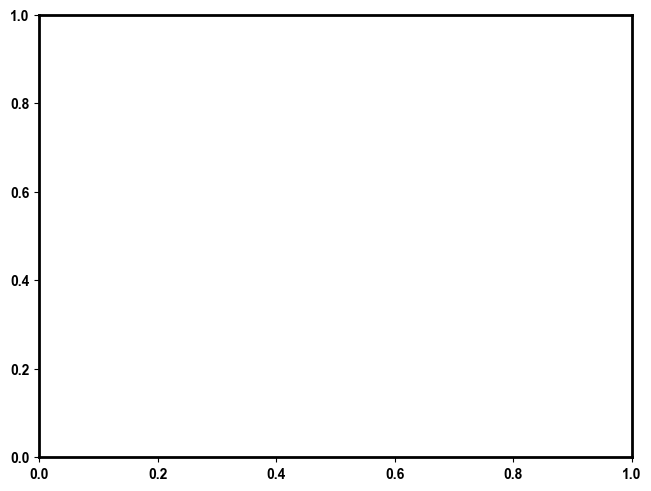

In [342]:
# Create the contour plot
fig, ax = plt.subplots(1, 1, layout="constrained")
cs = ax.contourf(X, Y, Z, cmap='viridis',
                 levels=200)  # levels=100)
fig.colorbar(cs, ax=ax, label='Predicted Strength')
sns.scatterplot('soft_monomers', 'hard_monomers',  # hue='strength_group', palette="viridis",
                data=df_eval_,)  # cmap='viridis', hue='true_strength',

ratios = np.arange(0, 0.8, 0.2)
colors = ['b', 'r', 'y', 'k']
for color, ratio in zip(colors, ratios):
    plt.plot([0, 1-ratio], [1-ratio, 0],  '--',
             color=color, linewidth=1, label=r'R$_{IBOA}$='+'{}'.format(round(ratio, 2)))
    plt.legend()

# Add labels and title
plt.xlabel('Sum of soft monomers')
plt.ylabel('Sum of 3 hard monomers')
plt.title('Contour Plot of strength prediction')
#plt.savefig('contourplot.png', dpi=500)

In [117]:
print (np.nanmax(Z))
print (np.nanmin(Z))

41.2363858060498
-1.7251509033253356


In [ ]:
Z = np.empty(X.shape)
row_count = 0
for x_row, y_row in zip(X, Y):
    column_count = 0
    for x, y in zip(x_row, y_row):
        print(x+y)
        Z[row_count, column_count] = np.where(x + y <= 1, x+y, np.nan)
        column_count += 1
    row_count += 1


0.0
1.0
1.0
2.0


In [ ]:
X_simulated = []
random.seed(10)


def generate_random_numbers_sum_between_zero_and_one(n):
    while True:
        numbers = [random.uniform(0, 1) for _ in range(n)]
        total_sum = sum(numbers)

        if 0 < total_sum < 1:
            return numbers


dimension = 2**2
for seed in range(dimension):
    random_numbers = generate_random_numbers_sum_between_zero_and_one(5,)
    X_simulated.append(random_numbers)

    #print("Generated random numbers:", random_numbers)
    #print("Sum:", sum(random_numbers))

X_sim = np.array(X_simulated)
strength_sim0 = gpr_strength.predict(X_sim)
print(strength_sim0.shape)
Z = strength_sim0.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))
x = X_sim[:, 0].ravel() + X_sim[:, 1].ravel()
y = X_sim[:, 2].ravel() + X_sim[:, 3].ravel() + X_sim[:, 4].ravel()
X = x.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))
Y = y.reshape(int(np.sqrt(dimension)), int(np.sqrt(dimension)))


[0.0, 0.0, 0.0, 0.0, 0.0]

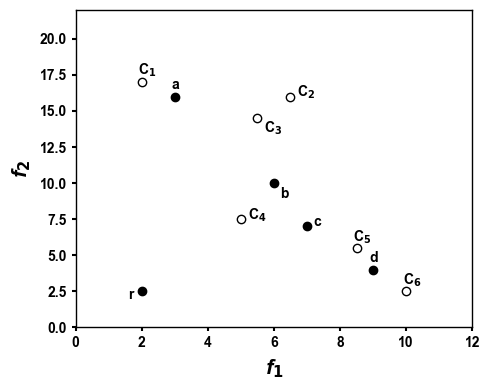

In [ ]:

Xs = [3, 6, 7, 9, 2]
Ys = [16, 10, 7, 4, 2.5]
fig, ax = plt.subplots(figsize=(5, 4))
plt.scatter(Xs, Ys, color='black')
list = ['a', 'b', 'c', 'd', 'r']
shiftx = [-0.1, +0.2, 0.2, -0.1, -0.4]
shifty = [0.5, -1, 0., 0.5, -0.5, ]
for i, txt in enumerate(list):
    ax.annotate(txt, (Xs[i] + shiftx[i], Ys[i] + shifty[i]))
plt.xlim(0, 12)
plt.ylim(0, 22)

[i.set_linewidth(1) for i in ax.spines.values()]

XCs = [2, 5.5, 6.5, 5, 8.5, 10]
YCs = [17, 14.5, 16, 7.5, 5.5, 2.5]

shiftx = [-0.1, +0.2, 0.2, 0.2, -0.1, -0.1]
shifty = [0.5, -1, 0., 0., 0.45, 0.5]

plt.scatter(XCs, YCs, color='white', edgecolors='black')
list = [r'C$_1$', r'C$_3$', r'C$_2$', r'C$_4$', r'C$_5$', r'C$_6$']
for i, txt in enumerate(list):
    ax.annotate(txt, (XCs[i]+shiftx[i], YCs[i]+shifty[i]), fontsize=10)
ax.set_xlabel(r'f$_1$', style='italic', fontsize='15',
              fontname='Arial', fontweight='bold', labelpad=5)
ax.set_ylabel(r'f$_2$', style='italic', fontsize='15',
              fontname='Arial', fontweight='bold', labelpad=5)
ax.tick_params(axis='both', length=3, width=1.5,
               colors='black', grid_alpha=0, labelsize=10)

plt.tight_layout()
plt.savefig('EHVI_simulated_graph.png', dpi=500)


In [40]:
print ('!!!!!!Done!!!!!!')

!!!!!!Done!!!!!!
